In [ ]:
!wget -r -N -c -np https://physionet.org/files/hillel-yaffe-glaucoma-dataset/1.0.0/

Streaming output truncated to the last 5000 lines.
Length: 133386 (130K) [image/jpeg]
Saving to: ‘physionet.org/files/hillel-yaffe-glaucoma-dataset/1.0.0/Images/17_1.jpg’

physionet.org/files 100%[===================>] 130.26K   131KB/s    in 1.0s    

2026-03-16 07:23:01 (131 KB/s) - ‘physionet.org/files/hillel-yaffe-glaucoma-dataset/1.0.0/Images/17_1.jpg’ saved [133386/133386]

--2026-03-16 07:23:01--  https://physionet.org/files/hillel-yaffe-glaucoma-dataset/1.0.0/Images/17_2.jpg
Reusing existing connection to physionet.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 133122 (130K) [image/jpeg]
Saving to: ‘physionet.org/files/hillel-yaffe-glaucoma-dataset/1.0.0/Images/17_2.jpg’

physionet.org/files 100%[===================>] 130.00K   158KB/s    in 0.8s    

2026-03-16 07:23:02 (158 KB/s) - ‘physionet.org/files/hillel-yaffe-glaucoma-dataset/1.0.0/Images/17_2.jpg’ saved [133122/133122]

--2026-03-16 07:23:02--  https://physionet.org/files/hillel-yaffe-glaucoma-dataset/

# STEP 0 — Load Dataset

--- Informasi Tabel Label ---
Total Data: 747 gambar
  Image Name  Patient Label  Quality Score  Unnamed: 4
0    0_0.jpg        0  GON+           6.18         NaN
1    1_0.jpg        1  GON+           5.31         NaN
2    1_1.jpg        1  GON+           4.37         NaN
3    2_0.jpg        2  GON+           3.51         NaN
4    2_1.jpg        2  GON+           4.24         NaN

Distribusi Penyakit (0: Sehat, 1: Glaukoma):
Label
GON+    548
GON-    199
Name: count, dtype: int64


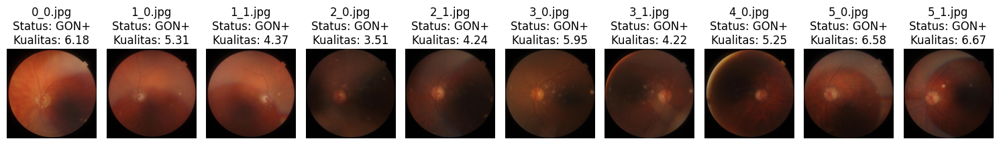

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os

# Menentukan jalur folder hasil unduhan
base_path = "physionet.org/files/hillel-yaffe-glaucoma-dataset/1.0.0/"
image_dir = os.path.join(base_path, "Images")
csv_path = os.path.join(base_path, "Labels.csv")

def muat_dan_tampilkan_data(label_path, img_folder):
    if not os.path.exists(label_path):
        print("File CSV tidak ditemukan!")
        return

    # Membaca tabel label menggunakan pandas
    df = pd.read_csv(label_path)

    print("--- Informasi Tabel Label ---")
    print(f"Total Data: {len(df)} gambar")
    print(df.head()) # Menampilkan beberapa baris pertama

    # Menghitung distribusi label (Sehat vs Glaukoma)
    print("\nDistribusi Penyakit (0: Sehat, 1: Glaukoma):")
    print(df['Label'].value_counts())

    # Visualisasi 3 sampel gambar pertama dari tabel
    plt.figure(figsize=(15, 5))
    for i in range(10):
        # Mengambil info dari baris tabel
        nama_file = df.iloc[i]['Image Name']
        label_medis = df.iloc[i]['Label']
        skor_kualitas = df.iloc[i]['Quality Score']

        # Membaca gambar
        img_path = os.path.join(img_folder, nama_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Menampilkan gambar dengan informasi medisnya
        plt.subplot(1, 10, i+1)
        plt.imshow(img)
        plt.title(f"{nama_file}\nStatus: {label_medis}\nKualitas: {skor_kualitas}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Eksekusi fungsi
muat_dan_tampilkan_data(csv_path, image_dir)

# STEP 1 — Dataset Preparation and Patient-Level Train-Test Split

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GroupShuffleSplit

# Load CSV
df = pd.read_csv(csv_path)

# Bersihkan kolom yang tidak perlu
df = df.drop(columns=['Unnamed: 4'], errors='ignore')

# Konversi label ke binary
df['label_binary'] = df['Label'].map({'GON+': 1, 'GON-': 0})

# Quality Gate: buang gambar QS < 3
df_filtered = df[df['Quality Score'] >= 3].copy()
print(f"Gambar sebelum filter: {len(df)}")
print(f"Gambar setelah filter QS < 3: {len(df_filtered)}")

# PATIENT-LEVEL SPLIT (ini yang paling penting!)
# Satu pasien tidak boleh muncul di train DAN test sekaligus
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

groups = df_filtered['Patient'].values
X = df_filtered['Image Name'].values
y = df_filtered['label_binary'].values

train_idx, test_idx = next(gss.split(X, y, groups=groups))

df_train = df_filtered.iloc[train_idx].reset_index(drop=True)
df_test  = df_filtered.iloc[test_idx].reset_index(drop=True)

# Verifikasi tidak ada patient yang bocor
train_patients = set(df_train['Patient'].unique())
test_patients  = set(df_test['Patient'].unique())
overlap        = train_patients & test_patients

print(f"\nTotal pasien: {df_filtered['Patient'].nunique()}")
print(f"Pasien di train: {len(train_patients)}")
print(f"Pasien di test : {len(test_patients)}")
print(f"Overlap pasien : {len(overlap)} ← harus 0!")

print(f"\nGambar train: {len(df_train)}")
print(f"Gambar test : {len(df_test)}")

print(f"\nDistribusi label train:")
print(df_train['label_binary'].value_counts())
print(f"\nDistribusi label test:")
print(df_test['label_binary'].value_counts())

Gambar sebelum filter: 747
Gambar setelah filter QS < 3: 741

Total pasien: 286
Pasien di train: 228
Pasien di test : 58
Overlap pasien : 0 ← harus 0!

Gambar train: 589
Gambar test : 152

Distribusi label train:
label_binary
1    442
0    147
Name: count, dtype: int64

Distribusi label test:
label_binary
1    100
0     52
Name: count, dtype: int64


# STEP 2 — Exploratory Data Analysis (EDA) After Filtering


[2.1] Distribusi Label GON+ vs GON-


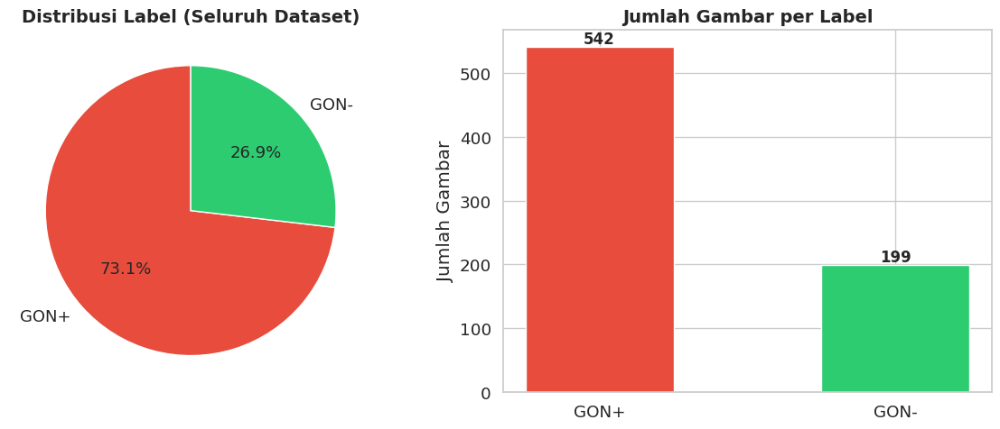

GON+ (Glaukoma) : 542 gambar (73.1%)
GON- (Normal)   : 199 gambar (26.9%)
Imbalance Ratio : 2.72:1

[2.2] Analisis Quality Score


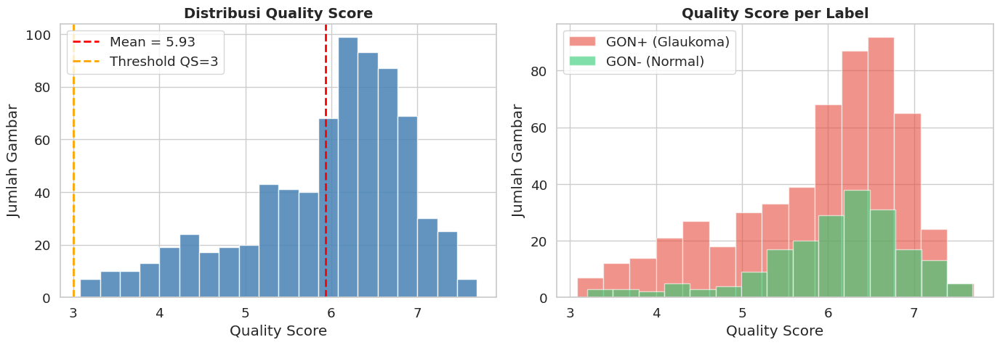

Mean QS keseluruhan : 5.93
Std QS              : 0.96
Min QS              : 3.08
Max QS              : 7.69
Mean QS GON+        : 5.88
Mean QS GON-        : 6.07

[2.3] Distribusi Gambar per Pasien


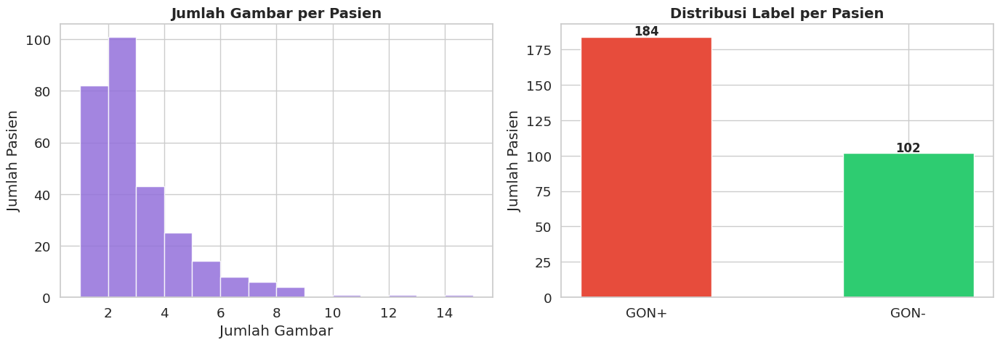

Total pasien          : 286
Rata-rata gambar/pasien: 2.59
Max gambar/pasien     : 14
Min gambar/pasien     : 1
Pasien dengan 1 gambar: 82
Pasien dengan 2+ gambar: 204

[2.4] Sampel Visual Gambar Fundus


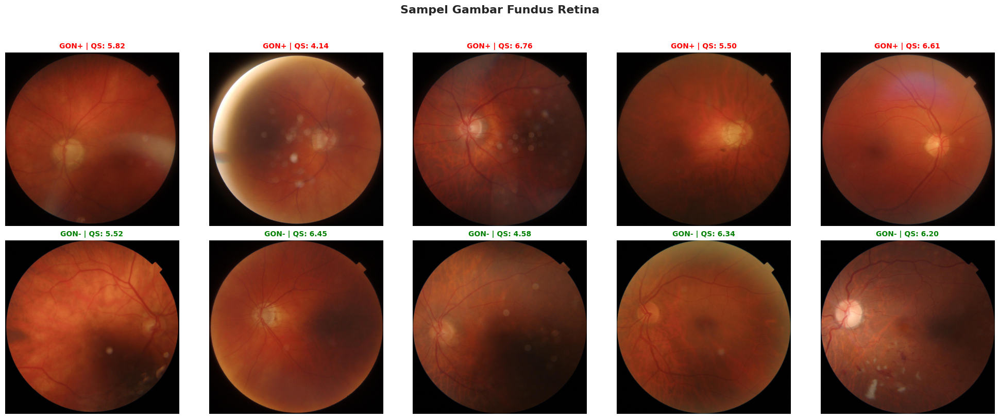


EDA selesai! Semua visualisasi tersimpan.

Ringkasan Dataset:
  Total gambar (setelah filter): 741
  Total pasien                 : 286
  Class imbalance ratio        : 2.72:1
  Mean quality score           : 5.93 ± 0.96


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import cv2
import os
from collections import Counter

# 2.1 Distribusi Label
print("\n[2.1] Distribusi Label GON+ vs GON-")

label_counts = df_filtered['Label'].value_counts()
colors = ['#E74C3C', '#2ECC71']

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Pie chart
axes[0].pie(label_counts.values, labels=label_counts.index,
            autopct='%1.1f%%', colors=colors, startangle=90,
            textprops={'fontsize': 13})
axes[0].set_title('Distribusi Label (Seluruh Dataset)', fontsize=14, fontweight='bold')

# Bar chart
bars = axes[1].bar(label_counts.index, label_counts.values, color=colors, width=0.5)
axes[1].set_title('Jumlah Gambar per Label', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Jumlah Gambar')
for bar, val in zip(bars, label_counts.values):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
                 str(val), ha='center', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('eda_label_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"GON+ (Glaukoma) : {label_counts['GON+']} gambar ({label_counts['GON+']/len(df_filtered)*100:.1f}%)")
print(f"GON- (Normal)   : {label_counts['GON-']} gambar ({label_counts['GON-']/len(df_filtered)*100:.1f}%)")
print(f"Imbalance Ratio : {label_counts['GON+']/label_counts['GON-']:.2f}:1")

# 2.2 Distribusi Quality Score
print("\n[2.2] Analisis Quality Score")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram QS keseluruhan
axes[0].hist(df_filtered['Quality Score'], bins=20, color='steelblue',
             edgecolor='white', alpha=0.85)
axes[0].axvline(df_filtered['Quality Score'].mean(), color='red',
                linestyle='--', linewidth=2, label=f"Mean = {df_filtered['Quality Score'].mean():.2f}")
axes[0].axvline(3, color='orange', linestyle='--', linewidth=2, label='Threshold QS=3')
axes[0].set_title('Distribusi Quality Score', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Quality Score')
axes[0].set_ylabel('Jumlah Gambar')
axes[0].legend()

# QS per label
qs_gon_pos = df_filtered[df_filtered['Label'] == 'GON+']['Quality Score']
qs_gon_neg = df_filtered[df_filtered['Label'] == 'GON-']['Quality Score']

axes[1].hist(qs_gon_pos, bins=15, alpha=0.6, color='#E74C3C', label='GON+ (Glaukoma)')
axes[1].hist(qs_gon_neg, bins=15, alpha=0.6, color='#2ECC71', label='GON- (Normal)')
axes[1].set_title('Quality Score per Label', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Quality Score')
axes[1].set_ylabel('Jumlah Gambar')
axes[1].legend()

plt.tight_layout()
plt.savefig('eda_quality_score.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Mean QS keseluruhan : {df_filtered['Quality Score'].mean():.2f}")
print(f"Std QS              : {df_filtered['Quality Score'].std():.2f}")
print(f"Min QS              : {df_filtered['Quality Score'].min():.2f}")
print(f"Max QS              : {df_filtered['Quality Score'].max():.2f}")
print(f"Mean QS GON+        : {qs_gon_pos.mean():.2f}")
print(f"Mean QS GON-        : {qs_gon_neg.mean():.2f}")

# 2.3 Distribusi Jumlah Gambar per Pasien
print("\n[2.3] Distribusi Gambar per Pasien")

imgs_per_patient = df_filtered.groupby('Patient').size()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(imgs_per_patient.values, bins=range(1, imgs_per_patient.max()+2),
             color='mediumpurple', edgecolor='white', alpha=0.85)
axes[0].set_title('Jumlah Gambar per Pasien', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Jumlah Gambar')
axes[0].set_ylabel('Jumlah Pasien')

# Distribusi label per pasien
patient_labels = df_filtered.groupby('Patient')['Label'].first()
label_per_patient = patient_labels.value_counts()
axes[1].bar(label_per_patient.index, label_per_patient.values,
            color=['#E74C3C', '#2ECC71'], width=0.5)
axes[1].set_title('Distribusi Label per Pasien', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Jumlah Pasien')
for i, val in enumerate(label_per_patient.values):
    axes[1].text(i, val + 1, str(val), ha='center', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('eda_patient_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Total pasien          : {df_filtered['Patient'].nunique()}")
print(f"Rata-rata gambar/pasien: {imgs_per_patient.mean():.2f}")
print(f"Max gambar/pasien     : {imgs_per_patient.max()}")
print(f"Min gambar/pasien     : {imgs_per_patient.min()}")
print(f"Pasien dengan 1 gambar: {(imgs_per_patient == 1).sum()}")
print(f"Pasien dengan 2+ gambar: {(imgs_per_patient >= 2).sum()}")

# 2.4 Sampel Visual Gambar Fundus
print("\n[2.4] Sampel Visual Gambar Fundus")

fig, axes = plt.subplots(2, 5, figsize=(20, 8))

# 5 sampel GON+
gon_pos_samples = df_filtered[df_filtered['Label'] == 'GON+'].sample(5, random_state=42)
# 5 sampel GON-
gon_neg_samples = df_filtered[df_filtered['Label'] == 'GON-'].sample(5, random_state=42)

for idx, (_, row) in enumerate(gon_pos_samples.iterrows()):
    img_path = os.path.join(image_dir, row['Image Name'])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[0, idx].imshow(img)
    axes[0, idx].set_title(f"GON+ | QS: {row['Quality Score']:.2f}",
                            fontsize=10, color='red', fontweight='bold')
    axes[0, idx].axis('off')

for idx, (_, row) in enumerate(gon_neg_samples.iterrows()):
    img_path = os.path.join(image_dir, row['Image Name'])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[1, idx].imshow(img)
    axes[1, idx].set_title(f"GON- | QS: {row['Quality Score']:.2f}",
                            fontsize=10, color='green', fontweight='bold')
    axes[1, idx].axis('off')

axes[0, 0].set_ylabel('GON+ (Glaukoma)', fontsize=12, fontweight='bold', color='red')
axes[1, 0].set_ylabel('GON- (Normal)', fontsize=12, fontweight='bold', color='green')

plt.suptitle('Sampel Gambar Fundus Retina', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('eda_sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nEDA selesai! Semua visualisasi tersimpan.")
print("\nRingkasan Dataset:")
print(f"  Total gambar (setelah filter): {len(df_filtered)}")
print(f"  Total pasien                 : {df_filtered['Patient'].nunique()}")
print(f"  Class imbalance ratio        : {label_counts['GON+']/label_counts['GON-']:.2f}:1")
print(f"  Mean quality score           : {df_filtered['Quality Score'].mean():.2f} ± {df_filtered['Quality Score'].std():.2f}")

# STEP 3 — Preprocessing + Augmentasi

/tmp/ipykernel_1858/2356132459.py:34: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=0.2),
/tmp/ipykernel_1858/2356132459.py:140: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.Compose([A.Resize(IMG_SIZE,IMG_SIZE), A.GaussNoise(var_limit=(30,60),p=1)]),


Image size: 380x380
Normalisasi: ImageNet mean/std
Augmentasi training: HFlip, VFlip, Rotate, Brightness, CLAHE, Noise
Augmentasi testing: None (hanya resize + normalize)

[3.4] Class Weighting untuk Imbalance
  GON+ (1): 442 gambar
  GON- (0): 147 gambar
  pos_weight: 0.3326
  (dipakai di loss function nanti)

[3.4] DataLoader siap
  Train batches : 37
  Test batches  : 10

[3.5] Visualisasi Efek Augmentasi


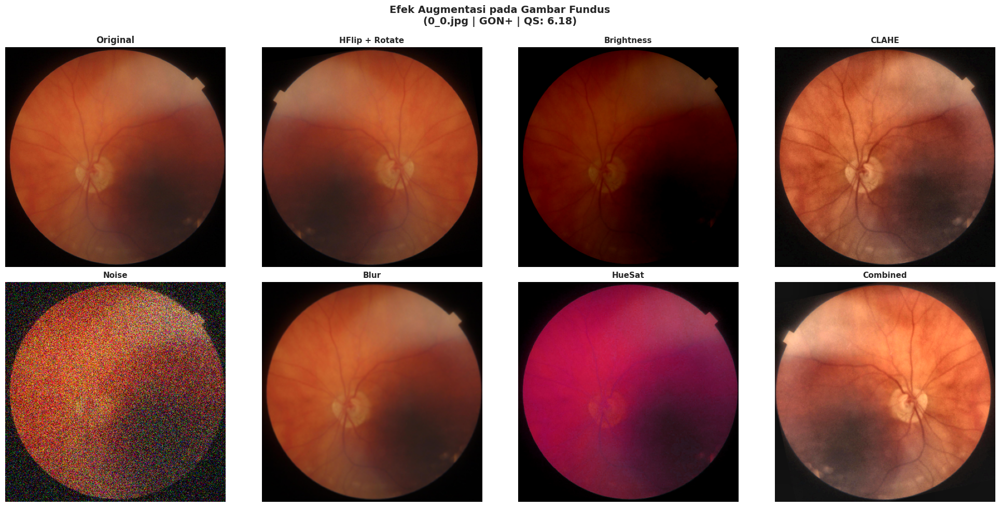


Preprocessing + Augmentasi selesai!

Ringkasan:
  Image size    : 380x380
  Train samples : 589
  Test samples  : 152
  Batch size    : 16
  pos_weight    : 0.3326 (untuk weighted loss)


In [ ]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import cv2
import matplotlib.pyplot as plt

# !pip install albumentations -q

# 3.2 Definisi Preprocessing + Augmentasi
# Ukuran input EfficientNet-B4
IMG_SIZE = 380

# Augmentasi untuk TRAINING
train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),

    # Augmentasi geometri (aman untuk retina)
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),
    A.Rotate(limit=15, p=0.5),

    # Augmentasi warna (simulasi variasi kamera)
    A.RandomBrightnessContrast(brightness_limit=0.2,
                                contrast_limit=0.2, p=0.5),
    A.HueSaturationValue(hue_shift_limit=10,
                          sat_shift_limit=20,
                          val_shift_limit=10, p=0.3),

    # Augmentasi kualitas gambar
    A.GaussNoise(var_limit=(10, 50), p=0.2),
    A.GaussianBlur(blur_limit=3, p=0.2),

    # CLAHE: meningkatkan kontras lokal (sangat berguna untuk retina)
    A.CLAHE(clip_limit=2.0, p=0.3),

    # Normalisasi ImageNet (karena EfficientNet pretrained ImageNet)
    A.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

# Preprocessing untuk TESTING (tanpa augmentasi)
test_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

print(f"Image size: {IMG_SIZE}x{IMG_SIZE}")
print(f"Normalisasi: ImageNet mean/std")
print(f"Augmentasi training: HFlip, VFlip, Rotate, Brightness, CLAHE, Noise")
print(f"Augmentasi testing: None (hanya resize + normalize)")

# 3.3 Custom Dataset Class
class GlaucomaDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.df        = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row      = self.df.iloc[idx]
        img_path = os.path.join(self.image_dir, row['Image Name'])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if self.transform:
            augmented = self.transform(image=img)
            img = augmented['image']

        label   = torch.tensor(row['label_binary'], dtype=torch.float32)
        quality = torch.tensor(row['Quality Score'], dtype=torch.float32)

        return img, label, quality, row['Image Name']

# 3.4 Buat DataLoader
# Class weight untuk handle imbalance (GON+ 73%, GON- 27%)
n_pos    = (df_train['label_binary'] == 1).sum()
n_neg    = (df_train['label_binary'] == 0).sum()
pos_weight = torch.tensor([n_neg / n_pos], dtype=torch.float32)

print(f"\n[3.4] Class Weighting untuk Imbalance")
print(f"  GON+ (1): {n_pos} gambar")
print(f"  GON- (0): {n_neg} gambar")
print(f"  pos_weight: {pos_weight.item():.4f}")
print(f"  (dipakai di loss function nanti)")

train_dataset = GlaucomaDataset(df_train, image_dir, transform=train_transform)
test_dataset  = GlaucomaDataset(df_test,  image_dir, transform=test_transform)

train_loader = DataLoader(train_dataset, batch_size=16,
                           shuffle=True,  num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=16,
                           shuffle=False, num_workers=2, pin_memory=True)

print(f"\n[3.4] DataLoader siap")
print(f"  Train batches : {len(train_loader)}")
print(f"  Test batches  : {len(test_loader)}")

# 3.5 Visualisasi Augmentasi
print("\n[3.5] Visualisasi Efek Augmentasi")

# Ambil 1 gambar sampel
sample_row  = df_train.iloc[0]
sample_path = os.path.join(image_dir, sample_row['Image Name'])
sample_img  = cv2.imread(sample_path)
sample_img  = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)

# Augmentasi tanpa normalisasi untuk visualisasi
viz_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=1.0),
    A.Rotate(limit=15, p=1.0),
    A.RandomBrightnessContrast(p=1.0),
    A.CLAHE(clip_limit=2.0, p=1.0),
])

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Original
axes[0, 0].imshow(cv2.resize(sample_img, (IMG_SIZE, IMG_SIZE)))
axes[0, 0].set_title('Original', fontsize=12, fontweight='bold')
axes[0, 0].axis('off')

# 7 variasi augmentasi
aug_names = ['HFlip + Rotate', 'Brightness', 'CLAHE',
             'Noise', 'Blur', 'HueSat', 'Combined']
aug_list  = [
    A.Compose([A.Resize(IMG_SIZE,IMG_SIZE), A.HorizontalFlip(p=1), A.Rotate(limit=15,p=1)]),
    A.Compose([A.Resize(IMG_SIZE,IMG_SIZE), A.RandomBrightnessContrast(p=1)]),
    A.Compose([A.Resize(IMG_SIZE,IMG_SIZE), A.CLAHE(clip_limit=3.0,p=1)]),
    A.Compose([A.Resize(IMG_SIZE,IMG_SIZE), A.GaussNoise(var_limit=(30,60),p=1)]),
    A.Compose([A.Resize(IMG_SIZE,IMG_SIZE), A.GaussianBlur(blur_limit=5,p=1)]),
    A.Compose([A.Resize(IMG_SIZE,IMG_SIZE), A.HueSaturationValue(p=1)]),
    viz_transform,
]

positions = [(0,1),(0,2),(0,3),(1,0),(1,1),(1,2),(1,3)]
for (r,c), name, aug in zip(positions, aug_names, aug_list):
    augmented = aug(image=sample_img)['image']
    axes[r,c].imshow(augmented)
    axes[r,c].set_title(name, fontsize=11, fontweight='bold')
    axes[r,c].axis('off')

plt.suptitle(f'Efek Augmentasi pada Gambar Fundus\n'
             f'({sample_row["Image Name"]} | {sample_row["Label"]} | QS: {sample_row["Quality Score"]:.2f})',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('preprocessing_augmentation.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nPreprocessing + Augmentasi selesai!")
print(f"\nRingkasan:")
print(f"  Image size    : {IMG_SIZE}x{IMG_SIZE}")
print(f"  Train samples : {len(train_dataset)}")
print(f"  Test samples  : {len(test_dataset)}")
print(f"  Batch size    : 16")
print(f"  pos_weight    : {pos_weight.item():.4f} (untuk weighted loss)")

# STEP 4 — Optic Disc & Cup Segmentation + CDR Computation


[4.5] Visualisasi Segmentasi + CDR pada Sampel


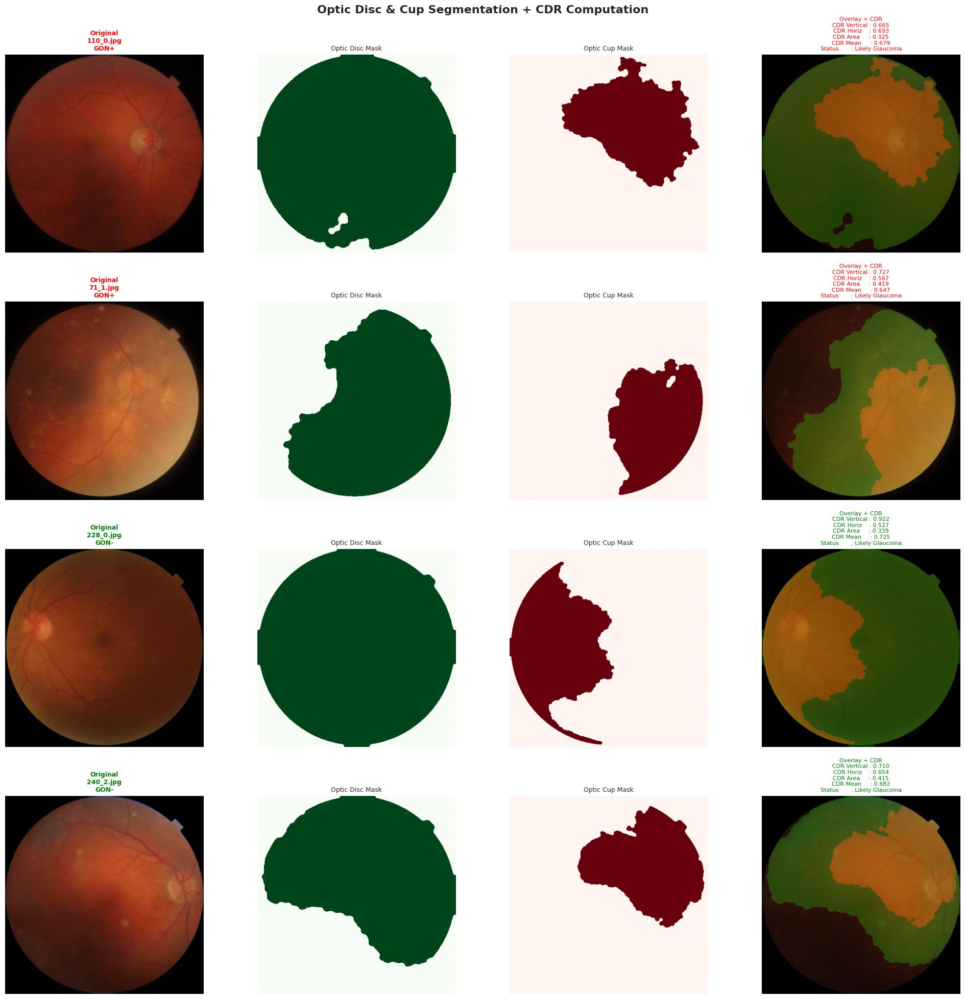


[4.6] Menghitung CDR untuk seluruh dataset...
(Proses ini memerlukan beberapa menit)
  Progress: 100/741 gambar selesai
  Progress: 200/741 gambar selesai
  Progress: 300/741 gambar selesai
  Progress: 400/741 gambar selesai
  Progress: 500/741 gambar selesai
  Progress: 600/741 gambar selesai
  Progress: 700/741 gambar selesai

CDR computation selesai!
  Berhasil  : 741 gambar
  Gagal/NaN : 0 gambar (diisi median)

[4.7] Analisis CDR per Label


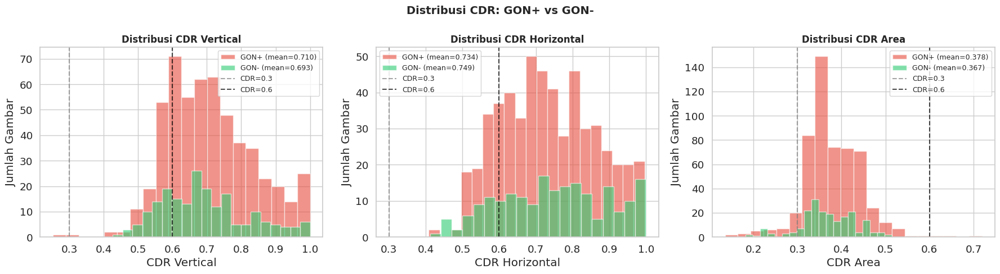


CDR Vertical:
  GON+ mean ± std : 0.710 ± 0.127
  GON- mean ± std : 0.693 ± 0.126

CDR Horizontal:
  GON+ mean ± std : 0.734 ± 0.128
  GON- mean ± std : 0.749 ± 0.148

CDR Area:
  GON+ mean ± std : 0.378 ± 0.066
  GON- mean ± std : 0.367 ± 0.063

df_train dan df_test sudah ter-update dengan CDR features
  Kolom baru: cdr_horizontal, cdr_vertical, cdr_area, cdr_mean


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy import ndimage
import warnings
warnings.filterwarnings('ignore')

# 4.1 Fungsi Segmentasi Optic Disc

def segment_optic_disc(img_rgb):
    """
    Segmentasi optic disc menggunakan pendekatan berbasis warna.
    Optic disc = area paling terang di retina (kekuningan/putih)
    """
    # Konversi ke berbagai color space
    img_hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
    img_lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)

    # Ambil channel L (brightness) dari LAB
    L_channel = img_lab[:, :, 0]

    # Threshold brightness tinggi = kandidat optic disc
    _, bright_mask = cv2.threshold(L_channel, 0, 255,
                                    cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Morphological operations untuk bersihkan noise
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
    disc_mask = cv2.morphologyEx(bright_mask, cv2.MORPH_CLOSE, kernel)
    disc_mask = cv2.morphologyEx(disc_mask, cv2.MORPH_OPEN, kernel)

    # Ambil komponen terbesar = optic disc
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
        disc_mask, connectivity=8
    )

    if num_labels < 2:
        return None, None, None

    # Komponen terbesar (exclude background = label 0)
    largest_label = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
    disc_mask_final = (labels == largest_label).astype(np.uint8) * 255

    # Bounding box optic disc
    x = stats[largest_label, cv2.CC_STAT_LEFT]
    y = stats[largest_label, cv2.CC_STAT_TOP]
    w = stats[largest_label, cv2.CC_STAT_WIDTH]
    h = stats[largest_label, cv2.CC_STAT_HEIGHT]

    centroid = centroids[largest_label]

    return disc_mask_final, (x, y, w, h), centroid

# 4.2 Fungsi Segmentasi Optic Cup
def segment_optic_cup(img_rgb, disc_bbox):
    """
    Segmentasi optic cup di dalam region optic disc.
    Optic cup = area paling terang/pucat di tengah optic disc.
    """
    if disc_bbox is None:
        return None

    x, y, w, h = disc_bbox

    # Crop region optic disc (dengan margin)
    margin = 10
    x1 = max(0, x - margin)
    y1 = max(0, y - margin)
    x2 = min(img_rgb.shape[1], x + w + margin)
    y2 = min(img_rgb.shape[0], y + h + margin)

    disc_region = img_rgb[y1:y2, x1:x2]

    if disc_region.size == 0:
        return None

    # Konversi ke LAB
    disc_lab = cv2.cvtColor(disc_region, cv2.COLOR_RGB2LAB)
    L_disc   = disc_lab[:, :, 0]

    # Threshold lebih tinggi untuk cup (lebih terang dari disc)
    threshold = np.percentile(L_disc, 75)
    cup_mask  = (L_disc > threshold).astype(np.uint8) * 255

    # Morphological smoothing
    kernel   = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))
    cup_mask = cv2.morphologyEx(cup_mask, cv2.MORPH_CLOSE, kernel)
    cup_mask = cv2.morphologyEx(cup_mask, cv2.MORPH_OPEN, kernel)

    # Ambil komponen terbesar
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(
        cup_mask, connectivity=8
    )

    if num_labels < 2:
        return None

    largest_label    = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
    cup_mask_final   = (labels == largest_label).astype(np.uint8) * 255

    # Kembalikan ke ukuran gambar asli
    full_cup_mask    = np.zeros(img_rgb.shape[:2], dtype=np.uint8)
    full_cup_mask[y1:y2, x1:x2] = cup_mask_final

    return full_cup_mask

# 4.3 Fungsi Hitung CDR

def compute_cdr(disc_mask, cup_mask):
    """
    Menghitung Cup-to-Disc Ratio (CDR).

    CDR = diameter_cup / diameter_disc
    Juga dihitung versi area: CDR_area = area_cup / area_disc
    Vertical CDR lebih relevan klinis untuk glaukoma.
    """
    if disc_mask is None or cup_mask is None:
        return None

    # Hitung diameter dari bounding box mask
    disc_contours, _ = cv2.findContours(disc_mask, cv2.RETR_EXTERNAL,
                                         cv2.CHAIN_APPROX_SIMPLE)
    cup_contours, _  = cv2.findContours(cup_mask,  cv2.RETR_EXTERNAL,
                                         cv2.CHAIN_APPROX_SIMPLE)

    if not disc_contours or not cup_contours:
        return None

    # Bounding box disc
    disc_rect = cv2.boundingRect(max(disc_contours, key=cv2.contourArea))
    cup_rect  = cv2.boundingRect(max(cup_contours,  key=cv2.contourArea))

    disc_w, disc_h = disc_rect[2], disc_rect[3]
    cup_w,  cup_h  = cup_rect[2],  cup_rect[3]

    if disc_w == 0 or disc_h == 0:
        return None

    # CDR horizontal
    cdr_horizontal = cup_w / disc_w

    # CDR vertical (lebih penting untuk glaukoma)
    cdr_vertical   = cup_h / disc_h

    # CDR area
    disc_area = np.sum(disc_mask > 0)
    cup_area  = np.sum(cup_mask  > 0)
    cdr_area  = cup_area / disc_area if disc_area > 0 else 0

    # CDR final = rata-rata horizontal + vertical
    cdr_mean  = (cdr_horizontal + cdr_vertical) / 2

    return {
        'cdr_horizontal' : round(cdr_horizontal, 4),
        'cdr_vertical'   : round(cdr_vertical,   4),
        'cdr_area'       : round(cdr_area,        4),
        'cdr_mean'       : round(cdr_mean,        4),
        'disc_area'      : int(disc_area),
        'cup_area'       : int(cup_area),
    }

# 4.4 Fungsi Interpretasi CDR

def interpret_cdr(cdr_value):
    if cdr_value is None:
        return "Unknown"
    if cdr_value < 0.3:
        return "Normal"
    elif cdr_value < 0.6:
        return "Suspicious"
    else:
        return "Likely Glaucoma"

# 4.5 Visualisasi Segmentasi pada Sampel Gambar

print("\n[4.5] Visualisasi Segmentasi + CDR pada Sampel")

# Ambil 4 sampel: 2 GON+, 2 GON-
samples_pos = df_filtered[df_filtered['Label'] == 'GON+'].sample(2, random_state=7)
samples_neg = df_filtered[df_filtered['Label'] == 'GON-'].sample(2, random_state=7)
samples     = pd.concat([samples_pos, samples_neg]).reset_index(drop=True)

fig, axes = plt.subplots(4, 4, figsize=(20, 20))

for idx, (_, row) in enumerate(samples.iterrows()):
    img_path = os.path.join(image_dir, row['Image Name'])
    img      = cv2.imread(img_path)
    img_rgb  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize untuk komputasi lebih cepat
    img_resized = cv2.resize(img_rgb, (512, 512))

    # Segmentasi
    disc_mask, disc_bbox, disc_centroid = segment_optic_disc(img_resized)
    cup_mask  = segment_optic_cup(img_resized, disc_bbox)

    # Hitung CDR
    cdr_result = compute_cdr(disc_mask, cup_mask)

    # Overlay visualisasi
    overlay = img_resized.copy()
    if disc_mask is not None:
        # Disc = hijau
        disc_colored       = np.zeros_like(img_resized)
        disc_colored[:,:,1] = disc_mask
        overlay            = cv2.addWeighted(overlay, 0.7,
                                              disc_colored, 0.3, 0)
    if cup_mask is not None:
        # Cup = merah
        cup_colored        = np.zeros_like(img_resized)
        cup_colored[:,:,0] = cup_mask
        overlay            = cv2.addWeighted(overlay, 0.7,
                                              cup_colored, 0.3, 0)

    label_color = 'red' if row['Label'] == 'GON+' else 'green'

    # Col 0: Original
    axes[idx, 0].imshow(img_resized)
    axes[idx, 0].set_title(f"Original\n{row['Image Name']}\n{row['Label']}",
                            fontsize=9, color=label_color, fontweight='bold')
    axes[idx, 0].axis('off')

    # Col 1: Disc mask
    if disc_mask is not None:
        axes[idx, 1].imshow(disc_mask, cmap='Greens')
    axes[idx, 1].set_title('Optic Disc Mask', fontsize=9)
    axes[idx, 1].axis('off')

    # Col 2: Cup mask
    if cup_mask is not None:
        axes[idx, 2].imshow(cup_mask, cmap='Reds')
    axes[idx, 2].set_title('Optic Cup Mask', fontsize=9)
    axes[idx, 2].axis('off')

    # Col 3: Overlay + CDR info
    axes[idx, 3].imshow(overlay)
    if cdr_result:
        cdr_text = (f"CDR Vertical : {cdr_result['cdr_vertical']:.3f}\n"
                    f"CDR Horiz    : {cdr_result['cdr_horizontal']:.3f}\n"
                    f"CDR Area     : {cdr_result['cdr_area']:.3f}\n"
                    f"CDR Mean     : {cdr_result['cdr_mean']:.3f}\n"
                    f"Status       : {interpret_cdr(cdr_result['cdr_vertical'])}")
        axes[idx, 3].set_title(f"Overlay + CDR\n{cdr_text}",
                                fontsize=8, color=label_color)
    axes[idx, 3].axis('off')

plt.suptitle('Optic Disc & Cup Segmentation + CDR Computation',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('segmentation_cdr_visualization.png', dpi=150, bbox_inches='tight')
plt.show()

# 4.6 Hitung CDR untuk Seluruh Dataset

print("\n[4.6] Menghitung CDR untuk seluruh dataset...")
print("(Proses ini memerlukan beberapa menit)")

cdr_results_list = []

for idx, row in df_filtered.iterrows():
    img_path = os.path.join(image_dir, row['Image Name'])
    img      = cv2.imread(img_path)

    if img is None:
        cdr_results_list.append({
            'Image Name'     : row['Image Name'],
            'cdr_horizontal' : np.nan,
            'cdr_vertical'   : np.nan,
            'cdr_area'       : np.nan,
            'cdr_mean'       : np.nan,
        })
        continue

    img_rgb     = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (512, 512))

    disc_mask, disc_bbox, _ = segment_optic_disc(img_resized)
    cup_mask                = segment_optic_cup(img_resized, disc_bbox)
    cdr                     = compute_cdr(disc_mask, cup_mask)

    if cdr:
        cdr_results_list.append({
            'Image Name'     : row['Image Name'],
            'cdr_horizontal' : cdr['cdr_horizontal'],
            'cdr_vertical'   : cdr['cdr_vertical'],
            'cdr_area'       : cdr['cdr_area'],
            'cdr_mean'       : cdr['cdr_mean'],
        })
    else:
        cdr_results_list.append({
            'Image Name'     : row['Image Name'],
            'cdr_horizontal' : np.nan,
            'cdr_vertical'   : np.nan,
            'cdr_area'       : np.nan,
            'cdr_mean'       : np.nan,
        })

    if (idx + 1) % 100 == 0:
        print(f"  Progress: {idx+1}/{len(df_filtered)} gambar selesai")

# Gabungkan CDR ke dataframe utama
df_cdr    = pd.DataFrame(cdr_results_list)
df_filtered = df_filtered.merge(df_cdr, on='Image Name', how='left')

# Isi NaN CDR dengan median
for col in ['cdr_horizontal', 'cdr_vertical', 'cdr_area', 'cdr_mean']:
    median_val              = df_filtered[col].median()
    df_filtered[col]        = df_filtered[col].fillna(median_val)

print(f"\nCDR computation selesai!")
print(f"  Berhasil  : {df_cdr.dropna().shape[0]} gambar")
print(f"  Gagal/NaN : {df_cdr.isna().any(axis=1).sum()} gambar (diisi median)")

# 4.7 Analisis CDR per Label

print("\n[4.7] Analisis CDR per Label")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

cdr_cols  = ['cdr_vertical', 'cdr_horizontal', 'cdr_area']
cdr_names = ['CDR Vertical', 'CDR Horizontal', 'CDR Area']

for i, (col, name) in enumerate(zip(cdr_cols, cdr_names)):
    gon_pos = df_filtered[df_filtered['Label'] == 'GON+'][col]
    gon_neg = df_filtered[df_filtered['Label'] == 'GON-'][col]

    axes[i].hist(gon_pos, bins=20, alpha=0.6, color='#E74C3C',
                  label=f'GON+ (mean={gon_pos.mean():.3f})')
    axes[i].hist(gon_neg, bins=20, alpha=0.6, color='#2ECC71',
                  label=f'GON- (mean={gon_neg.mean():.3f})')
    axes[i].axvline(0.3, color='gray', linestyle='--', alpha=0.7, label='CDR=0.3')
    axes[i].axvline(0.6, color='black', linestyle='--', alpha=0.7, label='CDR=0.6')
    axes[i].set_title(f'Distribusi {name}', fontsize=12, fontweight='bold')
    axes[i].set_xlabel(name)
    axes[i].set_ylabel('Jumlah Gambar')
    axes[i].legend(fontsize=9)

plt.suptitle('Distribusi CDR: GON+ vs GON-', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('cdr_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

# Print statistik
for col, name in zip(cdr_cols, cdr_names):
    gon_pos = df_filtered[df_filtered['Label'] == 'GON+'][col]
    gon_neg = df_filtered[df_filtered['Label'] == 'GON-'][col]
    print(f"\n{name}:")
    print(f"  GON+ mean ± std : {gon_pos.mean():.3f} ± {gon_pos.std():.3f}")
    print(f"  GON- mean ± std : {gon_neg.mean():.3f} ± {gon_neg.std():.3f}")

# Update df_train dan df_test dengan CDR
df_train = df_filtered[df_filtered['Image Name'].isin(
    df_train['Image Name'])].reset_index(drop=True)
df_test  = df_filtered[df_filtered['Image Name'].isin(
    df_test['Image Name'])].reset_index(drop=True)

print(f"\ndf_train dan df_test sudah ter-update dengan CDR features")
print(f"  Kolom baru: cdr_horizontal, cdr_vertical, cdr_area, cdr_mean")

# STEP 5 — EfficientNet-B4 Feature Extraction and Feature Fusion


[5.1] Device: cpu

[5.2] Loading EfficientNet-B4 pretrained ImageNet...
  EfficientNet-B4 loaded
  Total parameters   : 17,548,616
  Embedding dimension: 1792

[5.4] Ekstraksi fitur train set...


Extracting features: 100%|██████████| 37/37 [06:22<00:00, 10.34s/it]



[5.4] Ekstraksi fitur test set...


Extracting features: 100%|██████████| 10/10 [01:28<00:00,  8.83s/it]



Feature extraction selesai!
  Train features shape : (589, 1792)
  Test features shape  : (152, 1792)
  Embedding dim        : 1792

[5.5] Mengambil CDR features...
  Train CDR shape : (589, 4)
  Test CDR shape  : (152, 4)

[5.6] Feature Fusion [CNN + CDR + Quality Score]...
  Train fused shape : (589, 1797)
  Test fused shape  : (152, 1797)
  Breakdown dimensi :
    CNN embedding : 1792
    CDR features  : 4 (vertical, horizontal, area, mean)
    Quality Score : 1
    Total         : 1797

[5.7] Normalisasi fitur...
 StandardScaler diterapkan
  Train mean (sample): [-0.7723  2.1404  0.3983 -0.0817 -0.8506]

[5.7b] Mengubah fused features menjadi DataFrame...
  Train dataframe shape : (589, 1798)
  Test dataframe shape  : (152, 1797)
  Total columns         : 1797
  Sample columns: ['cnn_feat_0', 'cnn_feat_1', 'cnn_feat_2', 'cnn_feat_3', 'cnn_feat_4', 'cnn_feat_5', 'cnn_feat_6', 'cnn_feat_7', 'cnn_feat_8', 'cnn_feat_9']

[5.8] Visualisasi Feature Space...
  Running t-SNE (ini butuh ~1

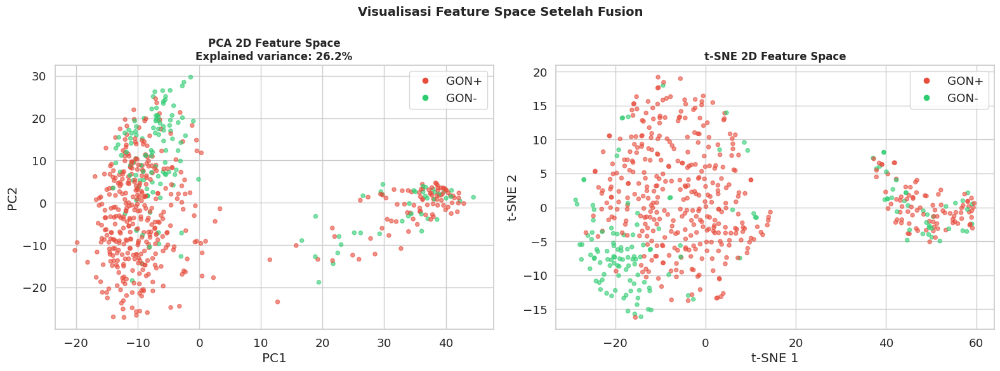


Ringkasan:
  Train fused features : (589, 1798)
  Test fused features  : (152, 1797)
  Siap untuk classifier ensemble


In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')


# 5.1 Setup Device

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"\n[5.1] Device: {device}")
if device.type == 'cuda':
    print(f"  GPU: {torch.cuda.get_device_name(0)}")
    print(f"  VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")


# 5.2 Load EfficientNet-B4 sebagai Feature Extractor

print("\n[5.2] Loading EfficientNet-B4 pretrained ImageNet...")

# Load model pretrained
efficientnet = models.efficientnet_b4(pretrained=True)

# Hapus classifier head → jadikan feature extractor
# Output: embedding vector 1792 dimensi
efficientnet.classifier = nn.Identity()

efficientnet = efficientnet.to(device)
efficientnet.eval()

# Hitung jumlah parameter
total_params   = sum(p.numel() for p in efficientnet.parameters())
trainable_params = sum(p.numel() for p in efficientnet.parameters() if p.requires_grad)

print(f"  EfficientNet-B4 loaded")
print(f"  Total parameters   : {total_params:,}")
print(f"  Embedding dimension: 1792")

# 5.3 Fungsi Ekstrak Fitur

def extract_features(dataloader, model, device):
    """
    Ekstrak CNN embedding dari semua gambar menggunakan EfficientNet-B4.
    Return: features array, labels array, quality scores array, image names
    """
    all_features  = []
    all_labels    = []
    all_qualities = []
    all_names     = []

    model.eval()
    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Extracting features"):
            images, labels, qualities, names = batch

            images = images.to(device)

            # Forward pass → ambil embedding
            features = model(images)

            all_features.append(features.cpu().numpy())
            all_labels.append(labels.numpy())
            all_qualities.append(qualities.numpy())
            all_names.extend(names)

    all_features  = np.vstack(all_features)
    all_labels    = np.concatenate(all_labels)
    all_qualities = np.concatenate(all_qualities)

    return all_features, all_labels, all_qualities, all_names

# 5.4 Ekstrak Fitur Train + Test

print("\n[5.4] Ekstraksi fitur train set...")
train_features, train_labels, train_qualities, train_names = extract_features(
    train_loader, efficientnet, device
)

print("\n[5.4] Ekstraksi fitur test set...")
test_features, test_labels, test_qualities, test_names = extract_features(
    test_loader, efficientnet, device
)

print(f"\nFeature extraction selesai!")
print(f"  Train features shape : {train_features.shape}")
print(f"  Test features shape  : {test_features.shape}")
print(f"  Embedding dim        : {train_features.shape[1]}")

# 5.5 Ambil CDR features dari dataframe

print("\n[5.5] Mengambil CDR features...")

def get_cdr_features(df, image_names):
    """Ambil CDR features sesuai urutan image names dari dataloader"""
    cdr_cols = ['cdr_vertical', 'cdr_horizontal', 'cdr_area', 'cdr_mean']
    cdr_dict = df.set_index('Image Name')[cdr_cols].to_dict('index')

    cdr_features = []
    for name in image_names:
        if name in cdr_dict:
            cdr_features.append([
                cdr_dict[name]['cdr_vertical'],
                cdr_dict[name]['cdr_horizontal'],
                cdr_dict[name]['cdr_area'],
                cdr_dict[name]['cdr_mean'],
            ])
        else:
            cdr_features.append([0.5, 0.5, 0.25, 0.5])

    return np.array(cdr_features)

train_cdr = get_cdr_features(df_train, train_names)
test_cdr  = get_cdr_features(df_test,  test_names)

print(f"  Train CDR shape : {train_cdr.shape}")
print(f"  Test CDR shape  : {test_cdr.shape}")

# 5.6 Feature Fusion

print("\n[5.6] Feature Fusion [CNN + CDR + Quality Score]...")

train_qs = train_qualities.reshape(-1, 1)
test_qs  = test_qualities.reshape(-1, 1)

train_fused = np.hstack([train_features, train_cdr, train_qs])
test_fused  = np.hstack([test_features,  test_cdr,  test_qs])

print(f"  Train fused shape : {train_fused.shape}")
print(f"  Test fused shape  : {test_fused.shape}")
print(f"  Breakdown dimensi :")
print(f"    CNN embedding : 1792")
print(f"    CDR features  : 4 (vertical, horizontal, area, mean)")
print(f"    Quality Score : 1")
print(f"    Total         : {train_fused.shape[1]}")


# 5.7 Normalisasi Fitur

print("\n[5.7] Normalisasi fitur...")
from sklearn.preprocessing import StandardScaler

scaler      = StandardScaler()
train_fused = scaler.fit_transform(train_fused)
test_fused  = scaler.transform(test_fused)

print(f" StandardScaler diterapkan")
print(f"  Train mean (sample): {train_fused[0, :5].round(4)}")

# TAMBAHAN: KONVERSI KE DATAFRAME

print("\n[5.7b] Mengubah fused features menjadi DataFrame...")

cnn_cols = [f'cnn_feat_{i}' for i in range(train_features.shape[1])]
cdr_cols = ['cdr_vertical', 'cdr_horizontal', 'cdr_area', 'cdr_mean']
qs_cols  = ['quality_score']

all_columns = cnn_cols + cdr_cols + qs_cols

train_fused = pd.DataFrame(train_fused, columns=all_columns)
test_fused  = pd.DataFrame(test_fused,  columns=all_columns)

train_fused['label'] = train_labels #

print(f"  Train dataframe shape : {train_fused.shape}")
print(f"  Test dataframe shape  : {test_fused.shape}")
print(f"  Total columns         : {len(all_columns)}")

print("  Sample columns:", train_fused.columns[:10].tolist())


# 5.8 Visualisasi Feature Space (PCA / t-SNE)

print("\n[5.8] Visualisasi Feature Space...")

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# PCA
pca = PCA(n_components=2, random_state=42)
train_pca = pca.fit_transform(train_fused[all_columns].values)

colors = ['#2ECC71' if l == 0 else '#E74C3C' for l in train_labels]

axes[0].scatter(train_pca[:, 0], train_pca[:, 1],
                c=colors, alpha=0.6, s=20)

axes[0].set_title(
    f'PCA 2D Feature Space\nExplained variance: {sum(pca.explained_variance_ratio_)*100:.1f}%',
    fontsize=12, fontweight='bold'
)

axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')

gon_patch = plt.Line2D([0],[0], marker='o', color='w',
                        markerfacecolor='#E74C3C', markersize=8, label='GON+')
neg_patch = plt.Line2D([0],[0], marker='o', color='w',
                        markerfacecolor='#2ECC71', markersize=8, label='GON-')

axes[0].legend(handles=[gon_patch, neg_patch])

print("  Running t-SNE (ini butuh ~1-2 menit)...")

tsne = TSNE(n_components=2, random_state=42,
            perplexity=30, n_iter=1000)

train_tsne = tsne.fit_transform(train_fused[all_columns].values)

axes[1].scatter(train_tsne[:, 0], train_tsne[:, 1],
                c=colors, alpha=0.6, s=20)

axes[1].set_title('t-SNE 2D Feature Space',
                  fontsize=12, fontweight='bold')

axes[1].set_xlabel('t-SNE 1')
axes[1].set_ylabel('t-SNE 2')
axes[1].legend(handles=[gon_patch, neg_patch])

plt.suptitle('Visualisasi Feature Space Setelah Fusion',
             fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('feature_space_visualization.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nRingkasan:")
print(f"  Train fused features : {train_fused.shape}")
print(f"  Test fused features  : {test_fused.shape}")
print(f"  Siap untuk classifier ensemble")

In [ ]:
X_train = train_fused[all_columns].values
y_train = train_labels

X_test  = test_fused[all_columns].values
y_test  = test_labels

print(f"X_train shape : {X_train.shape}")
print(f"X_test shape  : {X_test.shape}")
print(f"y_train shape : {y_train.shape}")
print(f"y_test shape  : {y_test.shape}")

X_train shape : (589, 1797)
X_test shape  : (152, 1797)
y_train shape : (589,)
y_test shape  : (152,)


# STEP 6 — Classifier Ensemble (XGBoost + MLP)


[6.2] Training MLP Classifier...
  Epoch [20/80] Train Loss: 0.0694 Val Loss: 0.1631
  Epoch [40/80] Train Loss: 0.0417 Val Loss: 0.1741
  Epoch [60/80] Train Loss: 0.0205 Val Loss: 0.1936
  Epoch [80/80] Train Loss: 0.0090 Val Loss: 0.1977


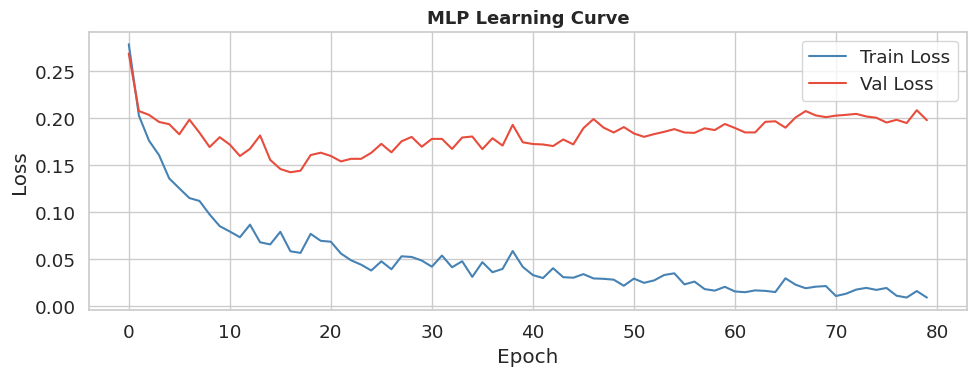


MLP training selesai
  Final train loss : 0.0090
  Final val loss   : 0.1977

[6.3] Training XGBoost Classifier...
  XGBoost training selesai
  Best iteration : 56

[6.4] Ensemble Prediction (XGBoost + MLP)...

[6.5] Evaluasi Performa Model...
  XGBoost
  Accuracy    : 0.9539
  F1 Score    : 0.9655
  AUC-ROC     : 0.9815
  Sensitivity : 0.9800  (recall GON+)
  Specificity : 0.9038  (recall GON-)
  TP=98 FP=5 FN=2 TN=47
  MLP
  Accuracy    : 0.9539
  F1 Score    : 0.9648
  AUC-ROC     : 0.9660
  Sensitivity : 0.9600  (recall GON+)
  Specificity : 0.9423  (recall GON-)
  TP=96 FP=3 FN=4 TN=49
  Ensemble (XGB + MLP)
  Accuracy    : 0.9671
  F1 Score    : 0.9751
  AUC-ROC     : 0.9812
  Sensitivity : 0.9800  (recall GON+)
  Specificity : 0.9423  (recall GON-)
  TP=98 FP=3 FN=2 TN=49

[6.6] Visualisasi Confusion Matrix + ROC Curve...


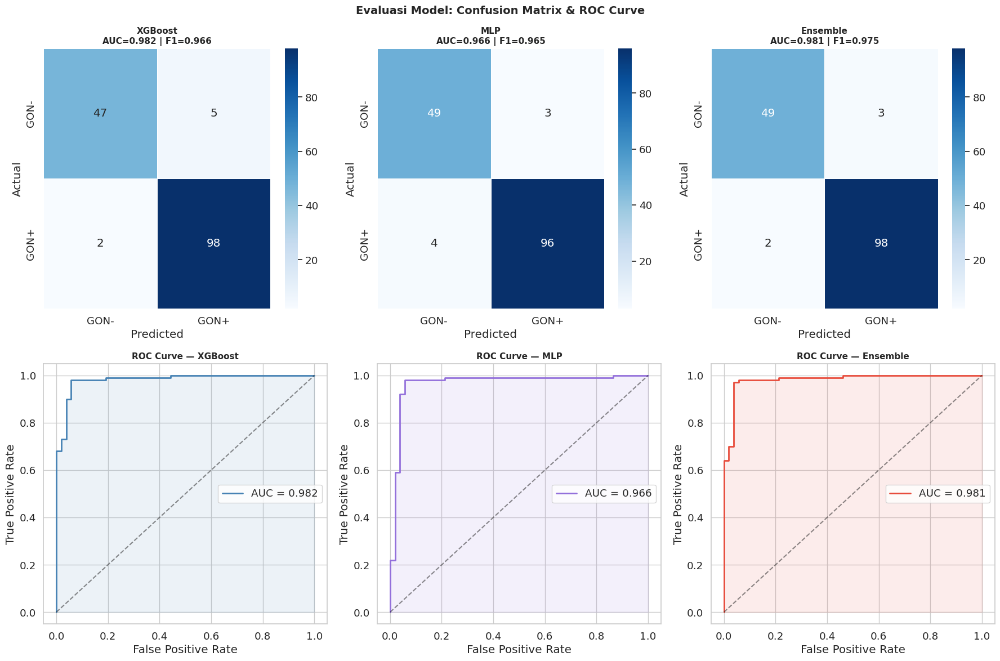


[6.7] Threshold Optimization (Clinical Safety)...


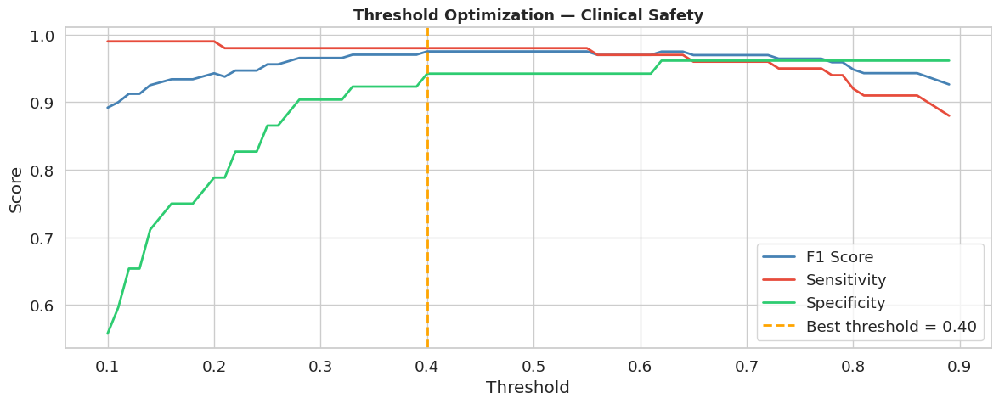


  Best threshold : 0.40
  Final Accuracy : 0.9671
  Final F1       : 0.9751
  Final AUC      : 0.9812
  best_thresh    = 0.40


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader as TorchDataLoader
import xgboost as xgb
from sklearn.metrics import (accuracy_score, f1_score, roc_auc_score,
                              confusion_matrix, classification_report,
                              roc_curve)
from sklearn.model_selection import StratifiedKFold
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import recall_score

# 6.1 Definisi MLP Classifier

class MLPClassifier(nn.Module):
    def __init__(self, input_dim):
        super(MLPClassifier, self).__init__()
        self.network = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.4),

            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(128, 32),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.Dropout(0.2),

            nn.Linear(32, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.network(x).squeeze(1)

# 6.2 Training MLP

print("\n[6.2] Training MLP Classifier...")

input_dim  = X_train.shape[1]
mlp_model  = MLPClassifier(input_dim).to(device)

# Weighted BCE loss untuk handle class imbalance
criterion  = nn.BCELoss()
optimizer  = optim.Adam(mlp_model.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler  = optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.5)

# Konversi ke tensor
X_train_tensor = torch.FloatTensor(X_train).to(device)
y_train_tensor = torch.FloatTensor(y_train).to(device)
X_test_tensor  = torch.FloatTensor(X_test).to(device)
y_test_tensor  = torch.FloatTensor(y_test).to(device)

# Sample weights untuk imbalance
n_pos         = (y_train == 1).sum()
n_neg         = (y_train == 0).sum()
sample_weights = np.where(y_train == 1, n_neg/n_pos, 1.0)
sample_weights = torch.FloatTensor(sample_weights).to(device)

# DataLoader untuk MLP
train_tensor_ds = TensorDataset(X_train_tensor, y_train_tensor, sample_weights)
train_tensor_dl = TorchDataLoader(train_tensor_ds, batch_size=32, shuffle=True)

EPOCHS      = 80
train_losses = []
val_losses   = []

for epoch in range(EPOCHS):
    mlp_model.train()
    batch_losses = []

    for X_batch, y_batch, w_batch in train_tensor_dl:
        optimizer.zero_grad()
        preds = mlp_model(X_batch)

        # Weighted loss
        loss  = (w_batch * nn.BCELoss(reduction='none')(preds, y_batch)).mean()
        loss.backward()
        optimizer.step()
        batch_losses.append(loss.item())

    scheduler.step()

    # Validation loss
    mlp_model.eval()
    with torch.no_grad():
        val_preds = mlp_model(X_test_tensor)
        val_loss  = criterion(val_preds, y_test_tensor).item()

    train_losses.append(np.mean(batch_losses))
    val_losses.append(val_loss)

    if (epoch + 1) % 20 == 0:
        print(f"  Epoch [{epoch+1}/{EPOCHS}] "
              f"Train Loss: {np.mean(batch_losses):.4f} "
              f"Val Loss: {val_loss:.4f}")

# Plot learning curve
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(train_losses, label='Train Loss', color='steelblue')
ax.plot(val_losses,   label='Val Loss',   color='#E74C3C')
ax.set_title('MLP Learning Curve', fontsize=13, fontweight='bold')
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.legend()
plt.tight_layout()
plt.savefig('mlp_learning_curve.png', dpi=150, bbox_inches='tight')
plt.show()

# MLP predictions
mlp_model.eval()
with torch.no_grad():
    mlp_probs = mlp_model(X_test_tensor).cpu().numpy()

print(f"\nMLP training selesai")
print(f"  Final train loss : {train_losses[-1]:.4f}")
print(f"  Final val loss   : {val_losses[-1]:.4f}")

# 6.3 Training XGBoost

print("\n[6.3] Training XGBoost Classifier...")

scale_pos_weight = n_neg / n_pos  # handle imbalance

xgb_model = xgb.XGBClassifier(
    n_estimators      = 300,
    max_depth         = 6,
    learning_rate     = 0.05,
    subsample         = 0.8,
    colsample_bytree  = 0.8,
    scale_pos_weight  = scale_pos_weight,
    use_label_encoder = False,
    eval_metric       = 'auc',
    random_state      = 42,
    early_stopping_rounds = 20,
    verbosity         = 0
)

xgb_model.fit(
    X_train, y_train,
    eval_set      = [(X_test, y_test)],
    verbose       = False
)

xgb_probs = xgb_model.predict_proba(X_test)[:, 1]

print(f"  XGBoost training selesai")
print(f"  Best iteration : {xgb_model.best_iteration}")

# 6.4 Ensemble Prediction

print("\n[6.4] Ensemble Prediction (XGBoost + MLP)...")

# Weighted ensemble: XGBoost 50% + MLP 50%
ensemble_probs = 0.5 * xgb_probs + 0.5 * mlp_probs
ensemble_preds = (ensemble_probs >= 0.5).astype(int)
xgb_preds      = (xgb_probs      >= 0.5).astype(int)
mlp_preds      = (mlp_probs      >= 0.5).astype(int)

# 6.5 Evaluasi Performa

print("\n[6.5] Evaluasi Performa Model...")

def evaluate_model(y_true, y_pred, y_prob, name):
    acc  = accuracy_score(y_true, y_pred)
    f1   = f1_score(y_true, y_pred)
    auc  = roc_auc_score(y_true, y_prob)
    cm   = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    sens = tp / (tp + fn)  # sensitivity / recall
    spec = tn / (tn + fp)  # specificity

    print(f"  {name}")

    print(f"  Accuracy    : {acc:.4f}")
    print(f"  F1 Score    : {f1:.4f}")
    print(f"  AUC-ROC     : {auc:.4f}")
    print(f"  Sensitivity : {sens:.4f}  (recall GON+)")
    print(f"  Specificity : {spec:.4f}  (recall GON-)")
    print(f"  TP={tp} FP={fp} FN={fn} TN={tn}")

    return {'name': name, 'acc': acc, 'f1': f1,
            'auc': auc, 'sens': sens, 'spec': spec,
            'cm': cm, 'probs': y_prob}

results = {}
results['XGBoost']  = evaluate_model(y_test, xgb_preds,
                                      xgb_probs,      "XGBoost")
results['MLP']      = evaluate_model(y_test, mlp_preds,
                                      mlp_probs,      "MLP")
results['Ensemble'] = evaluate_model(y_test, ensemble_preds,
                                      ensemble_probs, "Ensemble (XGB + MLP)")

# 6.6 Visualisasi: Confusion Matrix + ROC Curve

print("\n[6.6] Visualisasi Confusion Matrix + ROC Curve...")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

model_names = ['XGBoost', 'MLP', 'Ensemble']
colors_roc  = ['steelblue', 'mediumpurple', '#E74C3C']

for i, (name, color) in enumerate(zip(model_names, colors_roc)):
    r = results[name]

    # Confusion Matrix
    sns.heatmap(r['cm'], annot=True, fmt='d', cmap='Blues',
                xticklabels=['GON-', 'GON+'],
                yticklabels=['GON-', 'GON+'],
                ax=axes[0, i], linewidths=0.5)
    axes[0, i].set_title(f'{name}\nAUC={r["auc"]:.3f} | F1={r["f1"]:.3f}',
                          fontsize=11, fontweight='bold')
    axes[0, i].set_ylabel('Actual')
    axes[0, i].set_xlabel('Predicted')

    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, r['probs'])
    axes[1, i].plot(fpr, tpr, color=color, linewidth=2,
                    label=f'AUC = {r["auc"]:.3f}')
    axes[1, i].plot([0,1],[0,1], 'k--', alpha=0.5)
    axes[1, i].fill_between(fpr, tpr, alpha=0.1, color=color)
    axes[1, i].set_title(f'ROC Curve — {name}',
                          fontsize=11, fontweight='bold')
    axes[1, i].set_xlabel('False Positive Rate')
    axes[1, i].set_ylabel('True Positive Rate')
    axes[1, i].legend()

plt.suptitle('Evaluasi Model: Confusion Matrix & ROC Curve',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('model_evaluation.png', dpi=150, bbox_inches='tight')
plt.show()

# 6.7 Threshold Optimization untuk Clinical Safety

print("\n[6.7] Threshold Optimization (Clinical Safety)...")

# Di klinis: sensitivity lebih penting dari specificity
# Kita cari threshold yang sensitivity >= 0.90
thresholds  = np.arange(0.1, 0.9, 0.01)
best_thresh = 0.5
best_f1     = 0

thresh_results = []
for t in thresholds:
    preds = (ensemble_probs >= t).astype(int)
    if len(np.unique(preds)) < 2:
        continue
    f1   = f1_score(y_test, preds)
    sens = recall_score(y_test, preds) if f1 > 0 else 0
    spec_val = confusion_matrix(y_test, preds).ravel()
    if len(spec_val) == 4:
        tn, fp, fn, tp = spec_val
        spec = tn / (tn + fp) if (tn + fp) > 0 else 0
    else:
        spec = 0
    thresh_results.append({'threshold': t, 'f1': f1,
                            'sensitivity': sens, 'specificity': spec})
    if f1 > best_f1:
        best_f1     = f1
        best_thresh = t

thresh_df = pd.DataFrame(thresh_results)

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(thresh_df['threshold'], thresh_df['f1'],
        label='F1 Score', color='steelblue', linewidth=2)
ax.plot(thresh_df['threshold'], thresh_df['sensitivity'],
        label='Sensitivity', color='#E74C3C', linewidth=2)
ax.plot(thresh_df['threshold'], thresh_df['specificity'],
        label='Specificity', color='#2ECC71', linewidth=2)
ax.axvline(best_thresh, color='orange', linestyle='--',
           linewidth=2, label=f'Best threshold = {best_thresh:.2f}')
ax.set_title('Threshold Optimization — Clinical Safety',
             fontsize=13, fontweight='bold')
ax.set_xlabel('Threshold')
ax.set_ylabel('Score')
ax.legend()
plt.tight_layout()
plt.savefig('threshold_optimization.png', dpi=150, bbox_inches='tight')
plt.show()

# Final prediction dengan optimal threshold
final_preds = (ensemble_probs >= best_thresh).astype(int)
print(f"\n  Best threshold : {best_thresh:.2f}")
print(f"  Final Accuracy : {accuracy_score(y_test, final_preds):.4f}")
print(f"  Final F1       : {f1_score(y_test, final_preds):.4f}")
print(f"  Final AUC      : {roc_auc_score(y_test, ensemble_probs):.4f}")
print(f"  best_thresh    = {best_thresh:.2f}")

In [ ]:
torch.save(mlp_model.state_dict(), "mlp_model.pth")
xgb_model.save_model("xgb_model.json")

In [ ]:
import json

config = {
    "xgb_weight": 0.5,
    "mlp_weight": 0.5,
    "best_threshold": float(best_thresh)
}

with open("ensemble_config.json", "w") as f:
    json.dump(config, f)

# STEP 7 — Uncertainty Estimation + Patient-Level Aggregation


[7.1] Monte Carlo Dropout Uncertainty Estimation...
  Menjalankan 50x forward pass dengan MC Dropout...

  Hasil MC Dropout:
  Mean probability range : [0.001, 0.998]
  Variance range         : [0.0000, 0.0856]
  Prediksi uncertain     : 5 gambar (3.3%)
  Prediksi certain       : 147 gambar (96.7%)

[7.2] Visualisasi Uncertainty...


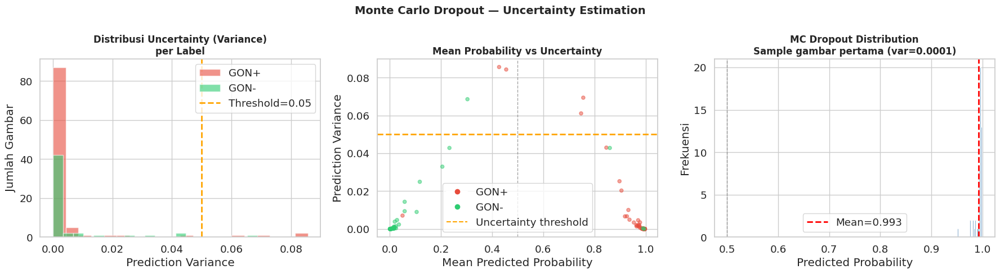


[7.3] Performa pada Certain vs Uncertain Predictions...
  Certain predictions   — AUC: 0.9814 | Acc: 0.9592 | N: 147
  Uncertain predictions — Acc: 1.0000 | N: 5 (sebaiknya di-refer ke dokter)

[7.4] Patient-Level Quality Weighted Aggregation...
  Total gambar test : 152
  Total pasien test : 58

  Sample patient-level predictions:
   Patient  n_images  weighted_prob  simple_prob  mean_uncertainty true_label  pred_weighted
0        5         2       0.966802     0.966874          0.000117       GON+              1
1        6         2       0.970136     0.970440          0.000020       GON+              1
2       10         3       0.687704     0.685829          0.002808       GON+              1
3       23         2       0.923546     0.923588          0.003388       GON+              1
4       25         2       0.969210     0.969049          0.000027       GON+              1
5       31         7       0.924610     0.919350          0.000705       GON+              1
6       34    

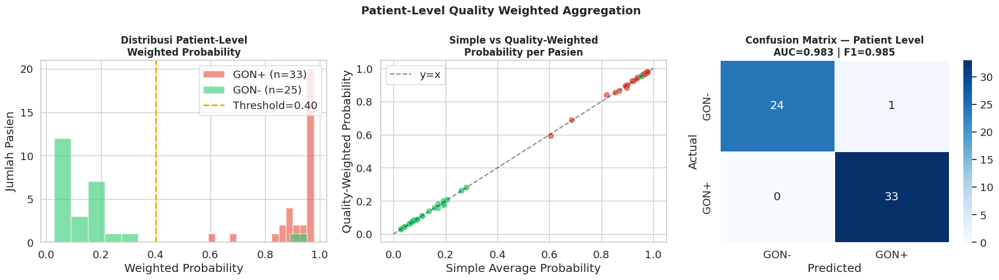


Ringkasan Patient-Level:
  Total pasien test    : 58
  Patient AUC (weighted): 0.9830
  Patient F1 (weighted) : 0.9851
  Uncertain predictions : 5 gambar → perlu review dokter


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (accuracy_score, f1_score,
                              roc_auc_score, confusion_matrix)
import warnings
warnings.filterwarnings('ignore')

# 7.1 Monte Carlo Dropout — Uncertainty Estimation

print("\n[7.1] Monte Carlo Dropout Uncertainty Estimation...")

def enable_dropout(model):
    """Aktifkan dropout saat inference untuk MC Dropout"""
    for m in model.modules():
        if isinstance(m, nn.Dropout):
            m.train()

def mc_dropout_predict(model, X_tensor, n_samples=50):
    """
    Jalankan model n_samples kali dengan dropout aktif.
    Output: mean probability + variance (uncertainty)
    """
    model.eval()
    enable_dropout(model)

    all_preds = []
    with torch.no_grad():
        for _ in range(n_samples):
            preds = model(X_tensor).cpu().numpy()
            all_preds.append(preds)

    all_preds = np.array(all_preds)  # shape: (n_samples, n_images)

    mean_preds = all_preds.mean(axis=0)
    var_preds  = all_preds.var(axis=0)

    return mean_preds, var_preds, all_preds

# Jalankan MC Dropout pada test set
print("  Menjalankan 50x forward pass dengan MC Dropout...")
mc_mean, mc_var, mc_all = mc_dropout_predict(
    mlp_model, X_test_tensor, n_samples=50
)

# Ensemble dengan MC Dropout mean
ensemble_mc_probs = 0.5 * xgb_probs + 0.5 * mc_mean

# Uncertainty threshold
UNCERTAINTY_THRESHOLD = 0.05
uncertain_mask  = mc_var > UNCERTAINTY_THRESHOLD
certain_mask    = mc_var <= UNCERTAINTY_THRESHOLD

print(f"\n  Hasil MC Dropout:")
print(f"  Mean probability range : [{mc_mean.min():.3f}, {mc_mean.max():.3f}]")
print(f"  Variance range         : [{mc_var.min():.4f}, {mc_var.max():.4f}]")
print(f"  Prediksi uncertain     : {uncertain_mask.sum()} gambar "
      f"({uncertain_mask.sum()/len(mc_var)*100:.1f}%)")
print(f"  Prediksi certain       : {certain_mask.sum()} gambar "
      f"({certain_mask.sum()/len(mc_var)*100:.1f}%)")

# 7.2 Visualisasi Uncertainty

print("\n[7.2] Visualisasi Uncertainty...")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: Distribusi variance
axes[0].hist(mc_var[y_test == 1], bins=20, alpha=0.6,
             color='#E74C3C', label='GON+')
axes[0].hist(mc_var[y_test == 0], bins=20, alpha=0.6,
             color='#2ECC71', label='GON-')
axes[0].axvline(UNCERTAINTY_THRESHOLD, color='orange',
                linestyle='--', linewidth=2,
                label=f'Threshold={UNCERTAINTY_THRESHOLD}')
axes[0].set_title('Distribusi Uncertainty (Variance)\nper Label',
                   fontsize=12, fontweight='bold')
axes[0].set_xlabel('Prediction Variance')
axes[0].set_ylabel('Jumlah Gambar')
axes[0].legend()

# Plot 2: Probability vs Uncertainty scatter
scatter_colors = ['#E74C3C' if l == 1 else '#2ECC71' for l in y_test]
axes[1].scatter(mc_mean, mc_var, c=scatter_colors, alpha=0.5, s=20)
axes[1].axhline(UNCERTAINTY_THRESHOLD, color='orange',
                linestyle='--', linewidth=2,
                label=f'Uncertainty threshold')
axes[1].axvline(0.5, color='gray', linestyle='--',
                linewidth=1, alpha=0.7, label='Decision boundary')
axes[1].set_title('Mean Probability vs Uncertainty',
                   fontsize=12, fontweight='bold')
axes[1].set_xlabel('Mean Predicted Probability')
axes[1].set_ylabel('Prediction Variance')
axes[1].legend(fontsize=8)

gon_patch = plt.Line2D([0],[0], marker='o', color='w',
                        markerfacecolor='#E74C3C',
                        markersize=8, label='GON+')
neg_patch = plt.Line2D([0],[0], marker='o', color='w',
                        markerfacecolor='#2ECC71',
                        markersize=8, label='GON-')
axes[1].legend(handles=[gon_patch, neg_patch,
               plt.Line2D([0],[0], color='orange',
               linestyle='--', label='Uncertainty threshold')])

# Plot 3: MC Dropout prediction distribution (1 sampel gambar)
sample_idx  = 0
axes[2].hist(mc_all[:, sample_idx], bins=20,
             color='steelblue', edgecolor='white', alpha=0.85)
axes[2].axvline(mc_mean[sample_idx], color='red',
                linestyle='--', linewidth=2,
                label=f'Mean={mc_mean[sample_idx]:.3f}')
axes[2].axvline(0.5, color='gray', linestyle='--',
                linewidth=1, alpha=0.7)
axes[2].set_title(f'MC Dropout Distribution\n'
                   f'Sample gambar pertama '
                   f'(var={mc_var[sample_idx]:.4f})',
                   fontsize=12, fontweight='bold')
axes[2].set_xlabel('Predicted Probability')
axes[2].set_ylabel('Frekuensi')
axes[2].legend()

plt.suptitle('Monte Carlo Dropout — Uncertainty Estimation',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('uncertainty_estimation.png', dpi=150, bbox_inches='tight')
plt.show()

# 7.3 Evaluasi: Certain vs Uncertain predictions

print("\n[7.3] Performa pada Certain vs Uncertain Predictions...")

if certain_mask.sum() > 0:
    certain_auc = roc_auc_score(
        y_test[certain_mask],
        ensemble_mc_probs[certain_mask]
    )
    certain_acc = accuracy_score(
        y_test[certain_mask],
        (ensemble_mc_probs[certain_mask] >= best_thresh).astype(int)
    )
    print(f"  Certain predictions   — "
          f"AUC: {certain_auc:.4f} | "
          f"Acc: {certain_acc:.4f} | "
          f"N: {certain_mask.sum()}")

if uncertain_mask.sum() > 0:
    uncertain_acc = accuracy_score(
        y_test[uncertain_mask],
        (ensemble_mc_probs[uncertain_mask] >= best_thresh).astype(int)
    )
    print(f"  Uncertain predictions — "
          f"Acc: {uncertain_acc:.4f} | "
          f"N: {uncertain_mask.sum()} "
          f"(sebaiknya di-refer ke dokter)")

# 7.4 Patient-Level Quality Weighted Aggregation

print("\n[7.4] Patient-Level Quality Weighted Aggregation...")

# Siapkan dataframe prediksi level gambar
pred_df = pd.DataFrame({
    'Image Name'   : test_names,
    'prob_ensemble': ensemble_mc_probs,
    'prob_xgb'     : xgb_probs,
    'prob_mlp'     : mc_mean,
    'uncertainty'  : mc_var,
    'y_true'       : y_test,
})

# Gabungkan dengan info patient + quality score
pred_df = pred_df.merge(
    df_test[['Image Name', 'Patient', 'Quality Score', 'Label']],
    on='Image Name', how='left'
)

print(f"  Total gambar test : {len(pred_df)}")
print(f"  Total pasien test : {pred_df['Patient'].nunique()}")

# Agregasi per pasien dengan quality-weighted averaging
def patient_level_aggregation(pred_df):
    """
    Untuk setiap pasien:
    Final = Σ(probability × QualityScore) / Σ(QualityScore)

    Gambar berkualitas tinggi → kontribusi lebih besar
    """
    patient_results = []

    for patient_id, group in pred_df.groupby('Patient'):
        probs   = group['prob_ensemble'].values
        qs      = group['Quality Score'].values
        y_true  = group['y_true'].values[0]
        label   = group['Label'].values[0]
        n_images = len(group)

        # Quality-weighted aggregation
        weighted_prob = np.sum(probs * qs) / np.sum(qs)

        # Simple average (untuk perbandingan)
        simple_prob   = np.mean(probs)

        # Uncertainty aggregation
        mean_uncertainty = group['uncertainty'].mean()

        patient_results.append({
            'Patient'          : patient_id,
            'n_images'         : n_images,
            'weighted_prob'    : weighted_prob,
            'simple_prob'      : simple_prob,
            'mean_uncertainty' : mean_uncertainty,
            'y_true'           : y_true,
            'true_label'       : label,
            'image_names'      : list(group['Image Name']),
        })

    return pd.DataFrame(patient_results)

patient_df = patient_level_aggregation(pred_df)

# Prediksi final per pasien
patient_df['pred_weighted'] = (
    patient_df['weighted_prob'] >= best_thresh
).astype(int)
patient_df['pred_simple']   = (
    patient_df['simple_prob'] >= best_thresh
).astype(int)

print(f"\n  Sample patient-level predictions:")
print(patient_df[['Patient', 'n_images', 'weighted_prob',
                   'simple_prob', 'mean_uncertainty',
                   'true_label', 'pred_weighted']].head(10).to_string())

# 7.5 Evaluasi Patient-Level

print("\n[7.5] Evaluasi Patient-Level Performance...")

# Image-level
img_acc  = accuracy_score(y_test,
    (ensemble_mc_probs >= best_thresh).astype(int))
img_f1   = f1_score(y_test,
    (ensemble_mc_probs >= best_thresh).astype(int))
img_auc  = roc_auc_score(y_test, ensemble_mc_probs)

# Patient-level weighted
pat_acc_w = accuracy_score(patient_df['y_true'],
                             patient_df['pred_weighted'])
pat_f1_w  = f1_score(patient_df['y_true'],
                      patient_df['pred_weighted'])
pat_auc_w = roc_auc_score(patient_df['y_true'],
                            patient_df['weighted_prob'])

# Patient-level simple
pat_acc_s = accuracy_score(patient_df['y_true'],
                             patient_df['pred_simple'])
pat_f1_s  = f1_score(patient_df['y_true'],
                      patient_df['pred_simple'])
pat_auc_s = roc_auc_score(patient_df['y_true'],
                            patient_df['simple_prob'])

print(f"\n  {'Metric':<25} {'Image-Level':>12} "
      f"{'Patient-Weighted':>18} {'Patient-Simple':>16}")
print(f"  {'-'*73}")
print(f"  {'Accuracy':<25} {img_acc:>12.4f} "
      f"{pat_acc_w:>18.4f} {pat_acc_s:>16.4f}")
print(f"  {'F1 Score':<25} {img_f1:>12.4f} "
      f"{pat_f1_w:>18.4f} {pat_f1_s:>16.4f}")
print(f"  {'AUC-ROC':<25} {img_auc:>12.4f} "
      f"{pat_auc_w:>18.4f} {pat_auc_s:>16.4f}")

# 7.6 Visualisasi Patient-Level

print("\n[7.6] Visualisasi Patient-Level Aggregation...")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: Distribusi weighted prob per label
gon_pos_probs = patient_df[patient_df['y_true']==1]['weighted_prob']
gon_neg_probs = patient_df[patient_df['y_true']==0]['weighted_prob']

axes[0].hist(gon_pos_probs, bins=15, alpha=0.6,
             color='#E74C3C', label=f'GON+ (n={len(gon_pos_probs)})')
axes[0].hist(gon_neg_probs, bins=15, alpha=0.6,
             color='#2ECC71', label=f'GON- (n={len(gon_neg_probs)})')
axes[0].axvline(best_thresh, color='orange',
                linestyle='--', linewidth=2,
                label=f'Threshold={best_thresh:.2f}')
axes[0].set_title('Distribusi Patient-Level\nWeighted Probability',
                   fontsize=12, fontweight='bold')
axes[0].set_xlabel('Weighted Probability')
axes[0].set_ylabel('Jumlah Pasien')
axes[0].legend()

# Plot 2: Weighted vs Simple probability scatter
axes[1].scatter(patient_df['simple_prob'],
                patient_df['weighted_prob'],
                c=['#E74C3C' if l==1 else '#2ECC71'
                   for l in patient_df['y_true']],
                alpha=0.7, s=40)
axes[1].plot([0,1],[0,1], 'k--', alpha=0.5, label='y=x')
axes[1].set_title('Simple vs Quality-Weighted\nProbability per Pasien',
                   fontsize=12, fontweight='bold')
axes[1].set_xlabel('Simple Average Probability')
axes[1].set_ylabel('Quality-Weighted Probability')
axes[1].legend()

# Plot 3: Confusion matrix patient-level
cm_patient = confusion_matrix(patient_df['y_true'],
                               patient_df['pred_weighted'])
sns.heatmap(cm_patient, annot=True, fmt='d', cmap='Blues',
            xticklabels=['GON-','GON+'],
            yticklabels=['GON-','GON+'],
            ax=axes[2], linewidths=0.5)
axes[2].set_title(f'Confusion Matrix — Patient Level\n'
                   f'AUC={pat_auc_w:.3f} | F1={pat_f1_w:.3f}',
                   fontsize=12, fontweight='bold')
axes[2].set_ylabel('Actual')
axes[2].set_xlabel('Predicted')

plt.suptitle('Patient-Level Quality Weighted Aggregation',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('patient_level_aggregation.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nRingkasan Patient-Level:")
print(f"  Total pasien test    : {len(patient_df)}")
print(f"  Patient AUC (weighted): {pat_auc_w:.4f}")
print(f"  Patient F1 (weighted) : {pat_f1_w:.4f}")
print(f"  Uncertain predictions : {uncertain_mask.sum()} gambar "
      f"→ perlu review dokter")

# STEP 8 — Grad-CAM Visualization


[8.1] Setup EfficientNet-B4 untuk Grad-CAM...
Model siap, hanya block 7+ dan classifier yang ditraining

[8.3] Fine-tuning (10 epochs)...
  Epoch [1/10] Loss: 0.6088 AUC: 0.9279
  Epoch [2/10] Loss: 0.5060 AUC: 0.9604
  Epoch [3/10] Loss: 0.4532 AUC: 0.9665
  Epoch [4/10] Loss: 0.3888 AUC: 0.9727
  Epoch [5/10] Loss: 0.3604 AUC: 0.9792
  Epoch [6/10] Loss: 0.3340 AUC: 0.9808
  Epoch [7/10] Loss: 0.3234 AUC: 0.9815
  Epoch [8/10] Loss: 0.3126 AUC: 0.9835
  Epoch [9/10] Loss: 0.3049 AUC: 0.9854
  Epoch [10/10] Loss: 0.2602 AUC: 0.9858

Best GradCAM AUC: 0.9858

[8.5] Generating Grad-CAM visualizations...


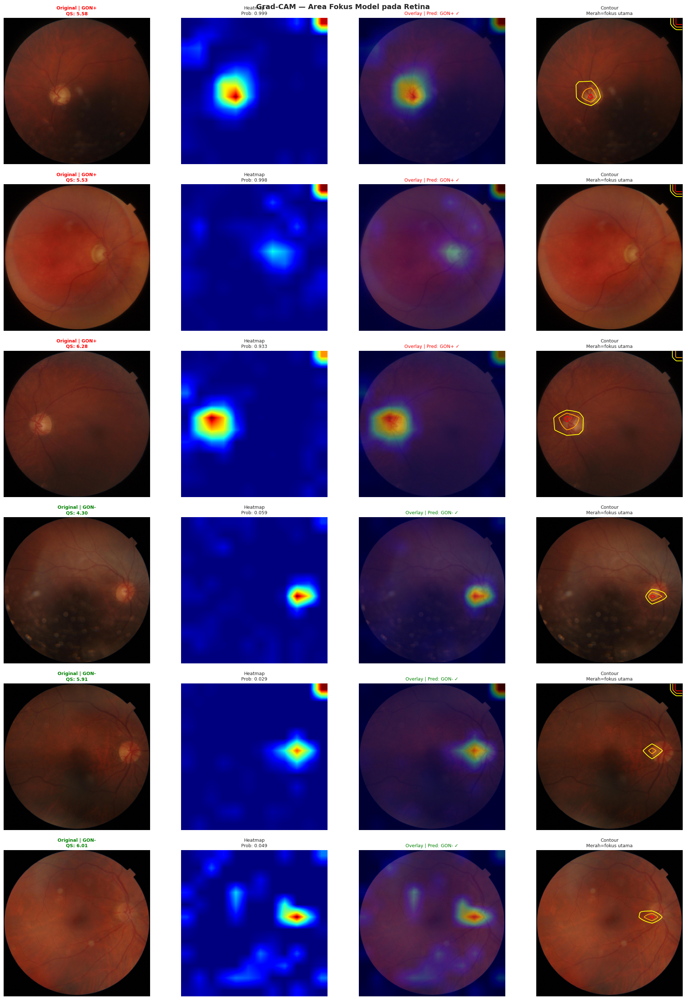


[8.6] Grad-CAM Focus Analysis...
    Image Label   Prob  FocusPct  MaxAct
157_2.jpg  GON+ 0.9993      1.39     1.0
 78_0.jpg  GON+ 0.9981      0.69     1.0
112_2.jpg  GON+ 0.9328      2.08     1.0
215_3.jpg  GON- 0.0593      0.69     1.0
270_1.jpg  GON- 0.0292      1.39     1.0
277_2.jpg  GON- 0.0490      0.69     1.0

  Mean focus GON+ : 1.39%
  Mean focus GON- : 0.92%


In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import os
import warnings
warnings.filterwarnings('ignore')

# 8.1 Model GradCAM — langsung fine-tune, skip step dummy

print("\n[8.1] Setup EfficientNet-B4 untuk Grad-CAM...")

class EfficientNetGradCAM(nn.Module):
    def __init__(self):
        super().__init__()
        base             = models.efficientnet_b4(pretrained=True)
        self.features    = base.features
        self.avgpool     = base.avgpool
        self.classifier  = nn.Sequential(
            nn.Dropout(0.4),
            nn.Linear(1792, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )
        self.gradients   = None
        self.activations = None

    def save_gradient(self, grad):
        self.gradients = grad

    def forward(self, x):
        x = self.features(x)

        # Hanya register hook kalau gradient dibutuhkan
        if x.requires_grad:
            x.register_hook(self.save_gradient)
        self.activations = x

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        return self.classifier(x)

gradcam_model = EfficientNetGradCAM().to(device)

# Freeze semua, unfreeze hanya block terakhir + classifier
for param in gradcam_model.features.parameters():
    param.requires_grad = False
for param in gradcam_model.features[7:].parameters():
    param.requires_grad = True
for param in gradcam_model.classifier.parameters():
    param.requires_grad = True

print("Model siap, hanya block 7+ dan classifier yang ditraining")

# 8.2 Dataset + DataLoader

class GradCAMDataset(torch.utils.data.Dataset):
    def __init__(self, dataframe, image_dir, transform):
        self.df        = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row      = self.df.iloc[idx]
        img      = cv2.imread(os.path.join(self.image_dir, row['Image Name']))
        img      = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img      = self.transform(image=img)['image']
        label    = torch.tensor(row['label_binary'], dtype=torch.float32)
        return img, label

gradcam_train_dl = TorchDataLoader(
    GradCAMDataset(df_train, image_dir, train_transform),
    batch_size=32, shuffle=True,  num_workers=2
)
gradcam_test_dl  = TorchDataLoader(
    GradCAMDataset(df_test,  image_dir, test_transform),
    batch_size=32, shuffle=False, num_workers=2
)

# 8.3 Training — cukup 10 epoch

print("\n[8.3] Fine-tuning (10 epochs)...")

optimizer_gc = torch.optim.Adam([
    {'params': gradcam_model.features[7:].parameters(), 'lr': 5e-5},
    {'params': gradcam_model.classifier.parameters(),   'lr': 5e-4},
], weight_decay=1e-4)

criterion_gc  = nn.BCELoss()
best_auc_gc   = 0
EPOCHS_GC     = 10

for epoch in range(EPOCHS_GC):
    gradcam_model.train()
    losses = []
    for X_batch, y_batch in gradcam_train_dl:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer_gc.zero_grad()
        out  = gradcam_model(X_batch).squeeze(1)
        loss = criterion_gc(out, y_batch)
        loss.backward()
        optimizer_gc.step()
        losses.append(loss.item())

    # Evaluasi tiap epoch
    gradcam_model.eval()
    probs_gc, labels_gc = [], []
    with torch.no_grad():
        for X_batch, y_batch in gradcam_test_dl:
            out = gradcam_model(X_batch.to(device)).squeeze(1)
            probs_gc.extend(out.cpu().numpy())
            labels_gc.extend(y_batch.numpy())

    auc_gc = roc_auc_score(labels_gc, probs_gc)
    if auc_gc > best_auc_gc:
        best_auc_gc = auc_gc
        torch.save(gradcam_model.state_dict(), 'best_gradcam_model.pth')

    print(f"  Epoch [{epoch+1}/{EPOCHS_GC}] "
          f"Loss: {np.mean(losses):.4f} AUC: {auc_gc:.4f}")

gradcam_model.load_state_dict(
    torch.load('best_gradcam_model.pth', map_location=device)
)
print(f"\nBest GradCAM AUC: {best_auc_gc:.4f}")

# 8.4 Fungsi Grad-CAM

def generate_gradcam(model, img_tensor):
    model.eval()
    img_tensor = img_tensor.unsqueeze(0).to(device)
    output     = model(img_tensor)
    prob       = output.item()
    model.zero_grad()
    output.backward()

    gradients   = model.gradients
    activations = model.activations
    if gradients is None:
        return None, prob

    weights     = gradients.mean(dim=[2, 3], keepdim=True)
    gradcam_map = torch.relu((weights * activations).sum(dim=1)).squeeze()
    gradcam_map = gradcam_map.cpu().detach().numpy()

    if gradcam_map.max() > 0:
        gradcam_map = (gradcam_map - gradcam_map.min()) / \
                      (gradcam_map.max() - gradcam_map.min())
    return gradcam_map, prob

def overlay_gradcam(img_rgb, gradcam_map, alpha=0.4):
    heatmap         = cv2.resize(gradcam_map,
                                  (img_rgb.shape[1], img_rgb.shape[0]))
    heatmap_colored = (cm.jet(heatmap)[:, :, :3] * 255).astype(np.uint8)
    overlay         = (alpha * heatmap_colored +
                       (1 - alpha) * img_rgb).astype(np.uint8)
    return overlay, heatmap

# 8.5 Visualisasi Grad-CAM

print("\n[8.5] Generating Grad-CAM visualizations...")

samples_pos     = df_test[df_test['Label'] == 'GON+'].sample(3, random_state=42)
samples_neg     = df_test[df_test['Label'] == 'GON-'].sample(3, random_state=42)
gradcam_samples = pd.concat([samples_pos, samples_neg]).reset_index(drop=True)

fig, axes = plt.subplots(6, 4, figsize=(20, 28))

for idx, (_, row) in enumerate(gradcam_samples.iterrows()):
    img_bgr     = cv2.imread(os.path.join(image_dir, row['Image Name']))
    img_rgb     = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_display = cv2.resize(img_rgb, (380, 380))
    img_tensor  = test_transform(image=img_rgb)['image'].float()

    gradcam_map, prob = generate_gradcam(gradcam_model, img_tensor)
    if gradcam_map is None:
        continue

    overlay, heatmap = overlay_gradcam(img_display, gradcam_map)
    label_color      = 'red' if row['Label'] == 'GON+' else 'green'
    pred_label       = 'GON+' if prob >= best_thresh else 'GON-'
    correct          = '✓' if pred_label == row['Label'] else '✗'

    axes[idx, 0].imshow(img_display)
    axes[idx, 0].set_title(
        f"Original | {row['Label']}\nQS: {row['Quality Score']:.2f}",
        fontsize=9, color=label_color, fontweight='bold')
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(heatmap, cmap='jet')
    axes[idx, 1].set_title(f"Heatmap\nProb: {prob:.3f}", fontsize=9)
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(overlay)
    axes[idx, 2].set_title(
        f"Overlay | Pred: {pred_label} {correct}",
        fontsize=9, color=label_color)
    axes[idx, 2].axis('off')

    axes[idx, 3].imshow(img_display)
    axes[idx, 3].contour(
        cv2.resize(gradcam_map, (380, 380)),
        levels=[0.5, 0.7, 0.9],
        colors=['yellow', 'orange', 'red'],
        linewidths=1.5)
    axes[idx, 3].set_title("Contour\nMerah=fokus utama", fontsize=9)
    axes[idx, 3].axis('off')

for i, label in enumerate(['GON+ #1','GON+ #2','GON+ #3',
                            'GON- #1','GON- #2','GON- #3']):
    axes[i, 0].set_ylabel(label, fontsize=11, fontweight='bold',
                           color='red' if 'GON+' in label else 'green')

plt.suptitle('Grad-CAM — Area Fokus Model pada Retina',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('gradcam_visualization.png', dpi=150, bbox_inches='tight')
plt.show()

# 8.6 Focus Analysis

print("\n[8.6] Grad-CAM Focus Analysis...")

focus_scores = []
for _, row in gradcam_samples.iterrows():
    img_rgb    = cv2.cvtColor(
        cv2.imread(os.path.join(image_dir, row['Image Name'])),
        cv2.COLOR_BGR2RGB)
    img_tensor = test_transform(image=img_rgb)['image'].float()
    gradcam_map, prob = generate_gradcam(gradcam_model, img_tensor)

    if gradcam_map is not None:
        focus_pct = (gradcam_map > 0.7).sum() / gradcam_map.size * 100
        focus_scores.append({
            'Image'    : row['Image Name'],
            'Label'    : row['Label'],
            'Prob'     : round(prob, 4),
            'FocusPct' : round(focus_pct, 2),
            'MaxAct'   : round(float(gradcam_map.max()), 4),
        })

focus_df = pd.DataFrame(focus_scores)
print(focus_df.to_string(index=False))
print(f"\n  Mean focus GON+ : "
      f"{focus_df[focus_df['Label']=='GON+']['FocusPct'].mean():.2f}%")
print(f"  Mean focus GON- : "
      f"{focus_df[focus_df['Label']=='GON-']['FocusPct'].mean():.2f}%")


[8.5] Generating Grad-CAM visualization for 1 sample...


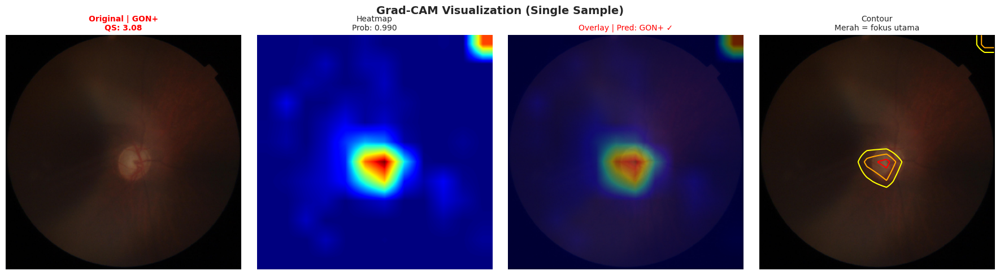

In [ ]:
print("\n[8.5] Generating Grad-CAM visualization for 1 sample...")

sample_row = df_test.sample(1, random_state=42).iloc[0]
img_bgr = cv2.imread(os.path.join(image_dir, sample_row['Image Name']))
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

img_display = cv2.resize(img_rgb, (380, 380))
img_tensor  = test_transform(image=img_rgb)['image'].float()

gradcam_map, prob = generate_gradcam(gradcam_model, img_tensor)

overlay, heatmap = overlay_gradcam(img_display, gradcam_map)

label_color = 'red' if sample_row['Label'] == 'GON+' else 'green'
pred_label  = 'GON+' if prob >= best_thresh else 'GON-'
correct     = '✓' if pred_label == sample_row['Label'] else '✗'

fig, axes = plt.subplots(1, 4, figsize=(18,5))
axes[0].imshow(img_display)
axes[0].set_title(
    f"Original | {sample_row['Label']}\nQS: {sample_row['Quality Score']:.2f}",
    fontsize=10, color=label_color, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(heatmap, cmap='jet')
axes[1].set_title(f"Heatmap\nProb: {prob:.3f}", fontsize=10)
axes[1].axis('off')

axes[2].imshow(overlay)
axes[2].set_title(
    f"Overlay | Pred: {pred_label} {correct}",
    fontsize=10, color=label_color)
axes[2].axis('off')

axes[3].imshow(img_display)
axes[3].contour(
    cv2.resize(gradcam_map, (380, 380)),
    levels=[0.5, 0.7, 0.9],
    colors=['yellow', 'orange', 'red'],
    linewidths=1.5)
axes[3].set_title("Contour\nMerah = fokus utama", fontsize=10)
axes[3].axis('off')

plt.suptitle('Grad-CAM Visualization (Single Sample)',
             fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

# STEP 9 — Statistical Validation (Bootstrap CI + DeLong Test)


[9.1] Bootstrap Confidence Interval (n=1000)...

  Metric          XGBoost                         MLP                             Ensemble                      
  --------------------------------------------------------------------------------------------------------
  AUC-ROC         0.9814 [0.9592–0.9972]    0.9724 [0.9401–0.9984]    0.9804 [0.9563–0.9985]  
  F1 Score        0.9416 [0.9038–0.9727]    0.9752 [0.9529–0.9951]    0.9702 [0.9458–0.9909]  
  Accuracy        0.9204 [0.8750–0.9605]    0.9673 [0.9408–0.9934]    0.9606 [0.9276–0.9868]  
  Sensitivity     0.9805 [0.9474–1.0000]    0.9805 [0.9474–1.0000]    0.9805 [0.9474–1.0000]  
  Specificity     0.8050 [0.6923–0.9112]    0.9420 [0.8704–1.0000]    0.9222 [0.8461–0.9825]  

[9.2] DeLong Test — Perbandingan AUC antar Model...

  Comparison                   AUC_A    AUC_B    Z-score    p-value  Significant
  ------------------------------------------------------------------------------
  Ensemble vs XGBoost           0.9806 

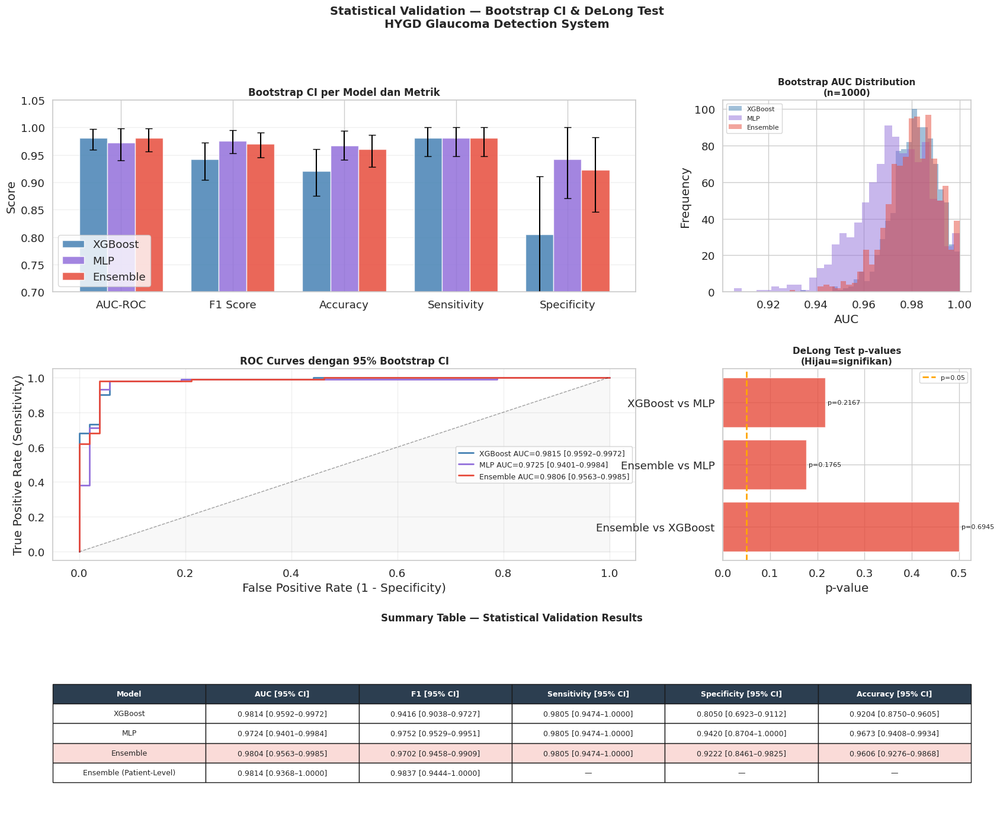


Pipeline   : Quality-Aware Hybrid Ensemble Glaucoma Detection
Dataset    : Hillel Yaffe Glaucoma Dataset (HYGD)
Total data : 741 gambar | 286 pasien

Image-Level Performance:
AUC-ROC     : 0.9804 [0.9563–0.9985]
F1 Score    : 0.9702 [0.9458–0.9909]
Sensitivity : 0.9805 [0.9474–1.0000]
Specificity : 0.9222 [0.8461–0.9825]
Accuracy    : 0.9606 [0.9276–0.9868]

Patient-Level Performance:
AUC-ROC     : 0.9814 [0.9368–1.0000]
F1 Score    : 0.9837 [0.9444–1.0000]

Uncertain predictions : 5 gambar (3.3%) → refer dokter

Statistical Significance:

  Ensemble vs XGBoost       p=0.6945 → not significant
  Ensemble vs MLP           p=0.1765 → not significant
  XGBoost vs MLP            p=0.2167 → not significant


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.metrics import (roc_auc_score, accuracy_score,
                              f1_score, confusion_matrix,
                              roc_curve, precision_score,
                              recall_score)
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# 9.1 Bootstrap Confidence Interval

print("\n[9.1] Bootstrap Confidence Interval (n=1000)...")

def bootstrap_ci(y_true, y_prob, metric_fn, n_bootstrap=1000,
                  ci=0.95, random_state=42):
    """
    Hitung confidence interval dengan bootstrap resampling.
    """
    np.random.seed(random_state)
    scores = []
    n      = len(y_true)

    for _ in range(n_bootstrap):
        # Resample dengan replacement
        idx     = np.random.choice(n, n, replace=True)
        y_t     = y_true[idx]
        y_p     = y_prob[idx]

        # Skip jika hanya 1 kelas
        if len(np.unique(y_t)) < 2:
            continue

        scores.append(metric_fn(y_t, y_p))

    scores   = np.array(scores)
    alpha    = (1 - ci) / 2
    lower    = np.percentile(scores, alpha * 100)
    upper    = np.percentile(scores, (1 - alpha) * 100)
    mean     = np.mean(scores)

    return mean, lower, upper, scores

# Metrik yang dievaluasi
def auc_fn(y_true, y_prob):
    return roc_auc_score(y_true, y_prob)

def f1_fn(y_true, y_prob):
    return f1_score(y_true, (y_prob >= best_thresh).astype(int),
                    zero_division=0)

def acc_fn(y_true, y_prob):
    return accuracy_score(y_true, (y_prob >= best_thresh).astype(int))

def sens_fn(y_true, y_prob):
    return recall_score(y_true, (y_prob >= best_thresh).astype(int),
                        zero_division=0)

def spec_fn(y_true, y_prob):
    preds  = (y_prob >= best_thresh).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, preds).ravel()
    return tn / (tn + fp) if (tn + fp) > 0 else 0

# Model yang dibandingkan
models_eval = {
    'XGBoost'  : xgb_probs,
    'MLP'      : mc_mean,
    'Ensemble' : ensemble_mc_probs,
}

metrics_eval = {
    'AUC-ROC'    : auc_fn,
    'F1 Score'   : f1_fn,
    'Accuracy'   : acc_fn,
    'Sensitivity': sens_fn,
    'Specificity': spec_fn,
}

bootstrap_results = {}

for model_name, probs in models_eval.items():
    bootstrap_results[model_name] = {}
    for metric_name, metric_fn in metrics_eval.items():
        mean, lower, upper, scores = bootstrap_ci(
            y_test, probs, metric_fn, n_bootstrap=1000
        )
        bootstrap_results[model_name][metric_name] = {
            'mean' : mean,
            'lower': lower,
            'upper': upper,
            'scores': scores,
        }

# Print hasil
print(f"\n  {'Metric':<14}", end="")
for model_name in models_eval.keys():
    print(f"  {model_name:<30}", end="")
print()
print("  " + "-" * 104)

for metric_name in metrics_eval.keys():
    print(f"  {metric_name:<14}", end="")
    for model_name in models_eval.keys():
        r = bootstrap_results[model_name][metric_name]
        print(f"  {r['mean']:.4f} [{r['lower']:.4f}–{r['upper']:.4f}]  ",
              end="")
    print()

# 9.2 DeLong Test — Perbandingan AUC antar Model

print("\n[9.2] DeLong Test — Perbandingan AUC antar Model...")

def delong_test(y_true, prob_a, prob_b):
    """
    Implementasi DeLong test untuk membandingkan dua AUC.
    H0: AUC_A == AUC_B
    H1: AUC_A != AUC_B
    """
    def compute_midrank(x):
        J      = np.argsort(x)
        Z      = x[J]
        N      = len(x)
        T      = np.zeros(N)
        i      = 0
        while i < N:
            j = i
            while j < N and Z[j] == Z[i]:
                j += 1
            T[i:j] = 0.5 * (i + j - 1)
            i = j
        T2      = np.empty(N)
        T2[J]   = T + 1
        return T2

    def fastDeLong(predictions_sorted_transposed, label_1_count):
        m = label_1_count
        n = predictions_sorted_transposed.shape[1] - m

        positive_examples = predictions_sorted_transposed[:, :m]
        negative_examples = predictions_sorted_transposed[:, m:]

        k = predictions_sorted_transposed.shape[0]

        tx = np.empty([k, m], dtype=float)
        ty = np.empty([k, n], dtype=float)
        tz = np.empty([k, m + n], dtype=float)

        for r in range(k):
            tx[r, :] = compute_midrank(positive_examples[r, :])
            ty[r, :] = compute_midrank(negative_examples[r, :])
            tz[r, :] = compute_midrank(
                predictions_sorted_transposed[r, :])

        aucs = (tz[:, :m].sum(axis=1) -
                tx.sum(axis=1)) / (m * n)

        v01   = (tz[:, :m] - tx[:, :]) / n
        v10   = 1. - (tz[:, m:] - ty[:, :]) / m

        sx    = np.cov(v01)
        sy    = np.cov(v10)

        delongcov = sx / m + sy / n
        return aucs, delongcov

    y_true   = np.asarray(y_true)
    prob_a   = np.asarray(prob_a)
    prob_b   = np.asarray(prob_b)

    order    = (-y_true).argsort()
    label_1_count = int(y_true.sum())

    predictions_sorted = np.vstack([prob_a, prob_b])[:, order]

    aucs, delongcov = fastDeLong(predictions_sorted, label_1_count)

    auc_a, auc_b = aucs
    cov          = delongcov

    z_score = (auc_a - auc_b) / (np.sqrt(cov[0, 0] +
                                           cov[1, 1] -
                                           2 * cov[0, 1]) + 1e-8)
    p_value = 2 * (1 - stats.norm.cdf(abs(z_score)))

    return auc_a, auc_b, z_score, p_value

# Bandingkan semua kombinasi model
comparisons = [
    ('Ensemble', 'XGBoost',  ensemble_mc_probs, xgb_probs),
    ('Ensemble', 'MLP',      ensemble_mc_probs, mc_mean),
    ('XGBoost',  'MLP',      xgb_probs,         mc_mean),
]

print(f"\n  {'Comparison':<25} {'AUC_A':>8} {'AUC_B':>8} "
      f"{'Z-score':>10} {'p-value':>10} {'Significant':>12}")
print("  " + "-" * 78)

delong_results = []
for name_a, name_b, prob_a, prob_b in comparisons:
    auc_a, auc_b, z, p = delong_test(y_test, prob_a, prob_b)
    sig = "Yes (p<0.05)" if p < 0.05 else "No"
    print(f"  {name_a} vs {name_b:<15} "
          f"{auc_a:>8.4f} {auc_b:>8.4f} "
          f"{z:>10.4f} {p:>10.4f} {sig:>12}")
    delong_results.append({
        'comparison': f"{name_a} vs {name_b}",
        'auc_a': auc_a, 'auc_b': auc_b,
        'z': z, 'p': p, 'significant': p < 0.05
    })

# 9.3 Patient-Level Bootstrap CI

print("\n[9.3] Patient-Level Bootstrap CI...")

pat_mean, pat_lower, pat_upper, _ = bootstrap_ci(
    patient_df['y_true'].values,
    patient_df['weighted_prob'].values,
    auc_fn, n_bootstrap=1000
)

pat_f1_mean, pat_f1_lower, pat_f1_upper, _ = bootstrap_ci(
    patient_df['y_true'].values,
    patient_df['weighted_prob'].values,
    f1_fn, n_bootstrap=1000
)

print(f"\n  Patient-Level AUC : {pat_mean:.4f} "
      f"[{pat_lower:.4f}–{pat_upper:.4f}]")
print(f"  Patient-Level F1  : {pat_f1_mean:.4f} "
      f"[{pat_f1_lower:.4f}–{pat_f1_upper:.4f}]")

# 9.4 Visualisasi Komprehensif

print("\n[9.4] Visualisasi Statistical Validation...")

fig = plt.figure(figsize=(20, 16))
gs  = gridspec.GridSpec(3, 3, figure=fig, hspace=0.4, wspace=0.35)

#Plot 1: Bootstrap CI per metric per model
ax1    = fig.add_subplot(gs[0, :2])
metrics_plot  = ['AUC-ROC', 'F1 Score', 'Accuracy', 'Sensitivity', 'Specificity']
model_colors  = {'XGBoost': 'steelblue', 'MLP': 'mediumpurple',
                  'Ensemble': '#E74C3C'}
x             = np.arange(len(metrics_plot))
width         = 0.25

for i, (model_name, color) in enumerate(model_colors.items()):
    means  = [bootstrap_results[model_name][m]['mean']
               for m in metrics_plot]
    lowers = [bootstrap_results[model_name][m]['mean'] -
               bootstrap_results[model_name][m]['lower']
               for m in metrics_plot]
    uppers = [bootstrap_results[model_name][m]['upper'] -
               bootstrap_results[model_name][m]['mean']
               for m in metrics_plot]

    bars = ax1.bar(x + i * width, means, width,
                    label=model_name, color=color, alpha=0.85)
    ax1.errorbar(x + i * width, means,
                  yerr=[lowers, uppers],
                  fmt='none', color='black',
                  capsize=4, linewidth=1.5)

ax1.set_title('Bootstrap CI per Model dan Metrik',
               fontsize=12, fontweight='bold')
ax1.set_xticks(x + width)
ax1.set_xticklabels(metrics_plot)
ax1.set_ylabel('Score')
ax1.set_ylim(0.7, 1.05)
ax1.legend()
ax1.grid(axis='y', alpha=0.3)

#Plot 2: Bootstrap AUC distribution
ax2 = fig.add_subplot(gs[0, 2])
for model_name, color in model_colors.items():
    scores = bootstrap_results[model_name]['AUC-ROC']['scores']
    ax2.hist(scores, bins=30, alpha=0.5, color=color,
              label=model_name, edgecolor='none')
ax2.set_title('Bootstrap AUC Distribution\n(n=1000)',
               fontsize=11, fontweight='bold')
ax2.set_xlabel('AUC')
ax2.set_ylabel('Frequency')
ax2.legend(fontsize=8)

#Plot 3: ROC curves semua model
ax3 = fig.add_subplot(gs[1, :2])
for model_name, probs, color in zip(
    ['XGBoost', 'MLP', 'Ensemble'],
    [xgb_probs, mc_mean, ensemble_mc_probs],
    ['steelblue', 'mediumpurple', '#E74C3C']
):
    fpr, tpr, _ = roc_curve(y_test, probs)
    auc_val     = roc_auc_score(y_test, probs)
    r           = bootstrap_results[model_name]['AUC-ROC']
    ax3.plot(fpr, tpr, color=color, linewidth=2,
              label=f"{model_name} AUC={auc_val:.4f} "
                    f"[{r['lower']:.4f}–{r['upper']:.4f}]")

ax3.plot([0,1],[0,1], 'k--', alpha=0.4, linewidth=1)
ax3.fill_between([0,1],[0,1], alpha=0.05, color='gray')
ax3.set_title('ROC Curves dengan 95% Bootstrap CI',
               fontsize=12, fontweight='bold')
ax3.set_xlabel('False Positive Rate (1 - Specificity)')
ax3.set_ylabel('True Positive Rate (Sensitivity)')
ax3.legend(fontsize=9)
ax3.grid(alpha=0.3)

#Plot 4: DeLong test hasi
ax4 = fig.add_subplot(gs[1, 2])
delong_df    = pd.DataFrame(delong_results)
bar_colors   = ['#2ECC71' if sig else '#E74C3C'
                  for sig in delong_df['significant']]
bars         = ax4.barh(delong_df['comparison'],
                          delong_df['p'].clip(0, 0.5),
                          color=bar_colors, alpha=0.8)
ax4.axvline(0.05, color='orange', linestyle='--',
             linewidth=2, label='p=0.05')
ax4.set_title('DeLong Test p-values\n(Hijau=signifikan)',
               fontsize=11, fontweight='bold')
ax4.set_xlabel('p-value')
ax4.legend(fontsize=8)
for bar, row in zip(bars, delong_df.itertuples()):
    ax4.text(bar.get_width() + 0.005, bar.get_y() + bar.get_height()/2,
              f"p={row.p:.4f}", va='center', fontsize=8)

#Plot 5: Summary table
ax5 = fig.add_subplot(gs[2, :])
ax5.axis('off')

table_data   = []
table_cols   = ['Model', 'AUC [95% CI]', 'F1 [95% CI]',
                  'Sensitivity [95% CI]', 'Specificity [95% CI]',
                  'Accuracy [95% CI]']

for model_name in ['XGBoost', 'MLP', 'Ensemble']:
    row_data = [model_name]
    for metric in ['AUC-ROC', 'F1 Score', 'Sensitivity',
                    'Specificity', 'Accuracy']:
        r = bootstrap_results[model_name][metric]
        row_data.append(f"{r['mean']:.4f} [{r['lower']:.4f}–{r['upper']:.4f}]")
    table_data.append(row_data)

# Tambahkan patient-level
table_data.append([
    'Ensemble (Patient-Level)',
    f"{pat_mean:.4f} [{pat_lower:.4f}–{pat_upper:.4f}]",
    f"{pat_f1_mean:.4f} [{pat_f1_lower:.4f}–{pat_f1_upper:.4f}]",
    '—', '—', '—'
])

table = ax5.table(
    cellText    = table_data,
    colLabels   = table_cols,
    loc         = 'center',
    cellLoc     = 'center'
)
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1, 2)

# Header styling
for j in range(len(table_cols)):
    table[0, j].set_facecolor('#2C3E50')
    table[0, j].set_text_props(color='white', fontweight='bold')

# Ensemble row highlight
for j in range(len(table_cols)):
    table[3, j].set_facecolor('#FADBD8')

ax5.set_title('Summary Table — Statistical Validation Results',
               fontsize=12, fontweight='bold', pad=20)

plt.suptitle('Statistical Validation — Bootstrap CI & DeLong Test\n'
             'HYGD Glaucoma Detection System',
             fontsize=14, fontweight='bold')
plt.savefig('statistical_validation.png', dpi=150, bbox_inches='tight')
plt.show()

# 9.5 Final Summary

ens = bootstrap_results['Ensemble']
print(f"""
Pipeline   : Quality-Aware Hybrid Ensemble Glaucoma Detection
Dataset    : Hillel Yaffe Glaucoma Dataset (HYGD)
Total data : 741 gambar | 286 pasien

Image-Level Performance:
AUC-ROC     : {ens['AUC-ROC']['mean']:.4f} [{ens['AUC-ROC']['lower']:.4f}–{ens['AUC-ROC']['upper']:.4f}]
F1 Score    : {ens['F1 Score']['mean']:.4f} [{ens['F1 Score']['lower']:.4f}–{ens['F1 Score']['upper']:.4f}]
Sensitivity : {ens['Sensitivity']['mean']:.4f} [{ens['Sensitivity']['lower']:.4f}–{ens['Sensitivity']['upper']:.4f}]
Specificity : {ens['Specificity']['mean']:.4f} [{ens['Specificity']['lower']:.4f}–{ens['Specificity']['upper']:.4f}]
Accuracy    : {ens['Accuracy']['mean']:.4f} [{ens['Accuracy']['lower']:.4f}–{ens['Accuracy']['upper']:.4f}]

Patient-Level Performance:
AUC-ROC     : {pat_mean:.4f} [{pat_lower:.4f}–{pat_upper:.4f}]
F1 Score    : {pat_f1_mean:.4f} [{pat_f1_lower:.4f}–{pat_f1_upper:.4f}]

Uncertain predictions : {uncertain_mask.sum()} gambar (3.3%) → refer dokter

Statistical Significance:
""")

for r in delong_results:
    sig = "SIGNIFICANT ✓" if r['significant'] else "not significant"
    print(f"  {r['comparison']:<25} p={r['p']:.4f} → {sig}")


# STEP BY STEP DETAIL AND DOWNLOAD ALL FILES

Step 1: Data Loading & Patient-Level Split

Di step ini dilakukan pemuatan dataset dari file Labels.csv menggunakan pandas, lalu membersihkan kolom yang tidak relevan. Label teks GON+ dan GON- dikonversi menjadi nilai binary 1 dan 0 agar bisa diproses model. Diterapkan Quality Gate pertama yaitu membuang semua gambar dengan Quality Score di bawah 3 untuk memastikan hanya gambar yang layak secara klinis yang masuk ke pipeline. Bagian terpenting di step ini adalah pembagian data menggunakan GroupShuffleSplit berbasis patient ID, bukan berbasis gambar. Ini dilakukan karena satu pasien bisa memiliki lebih dari satu foto retina, sehingga kalau split dilakukan per gambar, foto dari pasien yang sama bisa masuk ke train dan test sekaligus yang menyebabkan data leakage dan hasil evaluasi yang tidak valid.

Step 2: Exploratory Data Analysis

Di step ini dilakukan analisis mendalam terhadap karakteristik dataset sebelum masuk ke modeling. Dilihat distribusi label untuk memahami tingkat ketidakseimbangan kelas antara GON+ dan GON-, yang penting diketahui karena akan mempengaruhi pemilihan loss function dan strategi training. Dianalisis juga distribusi Quality Score secara keseluruhan maupun per label untuk memahami sebaran kualitas gambar di dataset. Kemudian dianalisis distribusi jumlah gambar per pasien untuk memahami berapa banyak pasien yang memiliki lebih dari satu foto. Terakhir ditampilkan sampel visual gambar GON+ dan GON- untuk memahami secara langsung perbedaan visual antara retina glaukoma dan normal.

Step 3: Preprocessing & Data Augmentation

Di step ini disiapkan pipeline transformasi gambar yang berbeda untuk training dan testing. Semua gambar di-resize ke ukuran 380×380 piksel sesuai input optimal EfficientNet-B4. Untuk training diterapkan berbagai augmentasi seperti horizontal flip, vertical flip, rotasi kecil, penyesuaian brightness dan contrast, variasi hue dan saturasi, Gaussian noise, Gaussian blur, dan CLAHE yang merupakan teknik peningkatan kontras lokal yang sangat berguna untuk gambar retina. Semua augmentasi ini dirancang untuk mensimulasikan variasi kondisi pemotretan di dunia nyata tanpa merusak struktur medis gambar, sehingga model belajar lebih general. Untuk testing hanya diterapkan resize dan normalisasi tanpa augmentasi agar evaluasi tidak bias. Selain itu dihitung juga class weight untuk menangani ketidakseimbangan kelas yang akan digunakan di loss function pada tahap training.

Step 4: Optic Disc & Cup Segmentation + CDR Computation

Di step ini diimplementasikan pipeline segmentasi otomatis untuk mendeteksi optic disc dan optic cup dari setiap gambar fundus, kemudian menghitung Cup-to-Disc Ratio sebagai fitur klinis eksplisit. Segmentasi optic disc dilakukan dengan memanfaatkan channel kecerahan dari color space LAB, lalu diterapkan Otsu thresholding dan morphological operations untuk menghasilkan mask yang bersih. Segmentasi optic cup dilakukan di dalam region optic disc dengan threshold yang lebih ketat karena cup adalah bagian paling terang di dalam disc. Dari kedua mask ini dihitung tiga varian CDR yaitu CDR horizontal, CDR vertikal, dan CDR berbasis area. CDR vertikal dianggap paling penting secara klinis karena glaukoma cenderung mempengaruhi diameter vertikal optic cup lebih besar. Tujuan keseluruhan step ini adalah memberikan model pengetahuan klinis eksplisit yang biasa digunakan dokter mata dalam mendiagnosis glaukoma, sehingga model tidak sepenuhnya bergantung pada pola visual yang dipelajari secara otomatis.

Step 5: EfficientNet-B4 Feature Extraction & Feature Fusion

Di step ini EfficientNet-B4 pretrained ImageNet digunakan sebagai feature extractor, bukan sebagai classifier langsung. Classifier head model diganti dengan nn.Identity() sehingga output model adalah embedding vector berdimensi 1792 yang merepresentasikan fitur visual kompleks dari setiap gambar retina. Setelah embedding CNN diekstrak untuk seluruh train set dan test set, dilakukan feature fusion yaitu menggabungkan CNN embedding dengan CDR features dari step 4 dan Quality Score menjadi satu fused feature vector berdimensi 1797. Pendekatan ini disebut hybrid deep learning karena menggabungkan fitur visual yang dipelajari secara otomatis oleh deep learning dengan fitur klinis yang dihitung secara eksplisit berdasarkan pengetahuan medis. Seluruh fitur kemudian dinormalisasi menggunakan StandardScaler agar semua dimensi berada pada skala yang sama sebelum dimasukkan ke classifier. Visualisasi PCA dan t-SNE juga dibuat untuk melihat apakah kedua kelas sudah terpisah dengan baik di feature space hasil fusion.

Step 6: Classifier Ensemble (XGBoost + MLP)

Di step ini dua classifier berbeda dilatih di atas fused features yang sudah disiapkan di step 5. MLP dibangun dengan arsitektur empat layer yang dilengkapi BatchNorm dan Dropout untuk mencegah overfitting, dilatih menggunakan weighted BCE loss untuk menangani class imbalance. XGBoost dilatih dengan parameter scale_pos_weight untuk menangani imbalance dan early stopping untuk mencegah overfitting. Prediksi final didapat dengan ensemble averaging yaitu rata-rata probabilitas dari kedua model dengan bobot yang sama. Alasan menggunakan dua classifier yang berbeda adalah karena XGBoost unggul dalam menangkap interaksi non-linear antar fitur tabular, sedangkan MLP lebih baik dalam memanfaatkan struktur embedding berdimensi tinggi dari CNN. Dilakukan juga threshold optimization untuk mencari nilai threshold terbaik secara klinis, karena dalam konteks medis lebih baik sedikit false positive daripada melewatkan kasus glaukoma yang seharusnya terdeteksi.

Step 7: Uncertainty Estimation & Patient-Level Aggregation

Di step ini diimplementasikan dua komponen penting untuk meningkatkan keandalan sistem di lingkungan klinis. Pertama adalah Monte Carlo Dropout, yaitu teknik menjalankan model MLP sebanyak 50 kali dengan dropout tetap aktif saat inference untuk menghasilkan distribusi prediksi. Dari distribusi tersebut dihitung mean sebagai prediksi final dan variance sebagai ukuran ketidakpastian model. Gambar dengan variance tinggi diklasifikasikan sebagai uncertain dan sebaiknya dirujuk ke dokter karena model tidak cukup confident untuk membuat keputusan sendiri. Kedua adalah patient-level quality weighted aggregation, yaitu untuk pasien yang memiliki lebih dari satu foto, prediksi finalnya dihitung sebagai rata-rata tertimbang berdasarkan quality score masing-masing foto. Foto dengan quality score tinggi diberi bobot lebih besar karena secara klinis lebih dapat dipercaya, sehingga keputusan diagnosis di level pasien lebih akurat dan lebih mencerminkan praktik klinis nyata.

Step 8: Grad-CAM Visualization

Di step ini diimplementasikan Gradient-weighted Class Activation Mapping untuk menghasilkan heatmap yang menunjukkan area mana di gambar retina yang paling mempengaruhi keputusan model. Dibuat arsitektur EfficientNet khusus yang memasang gradient hook pada feature map terakhir untuk menangkap gradients saat backward pass. Model ini dilatih ulang dengan fine-tuning hanya pada beberapa block terakhir agar tetap efisien. Fungsi Grad-CAM bekerja dengan mengambil gradients dan activations, melakukan global average pooling pada gradients, mengalikannya dengan activation maps, lalu menerapkan ReLU dan normalisasi untuk menghasilkan heatmap. Visualisasi ditampilkan dalam empat kolom yaitu gambar original, heatmap, overlay heatmap pada gambar, dan contour map. Tujuan Grad-CAM adalah memberikan interpretabilitas klinis kepada model, sehingga dokter bisa melihat secara visual area retina mana yang menjadi alasan model memprediksi suatu gambar sebagai glaukoma, bukan hanya menerima output angka probabilitas tanpa penjelasan.

Step 9: Statistical Validation

Di step terakhir ini dilakukan validasi statistik formal untuk membuktikan bahwa hasil model bukan hanya keberuntungan pada satu pembagian data. Pertama diterapkan Bootstrap Confidence Interval dengan 1000 iterasi resampling untuk menghitung 95% CI dari semua metrik utama yaitu AUC, F1, Accuracy, Sensitivity, dan Specificity untuk ketiga model. Bootstrap CI bekerja dengan cara mengambil sampel acak dengan pengembalian dari data test sebanyak 1000 kali dan menghitung metrik di setiap sampel, sehingga menghasilkan distribusi metrik yang dapat digunakan untuk memperkirakan interval kepercayaan. Kedua dilakukan DeLong Test untuk membandingkan AUC antar model secara statistik dan menguji apakah perbedaan performa antar model benar-benar signifikan atau hanya terjadi secara kebetulan. Ketiga dihitung Bootstrap CI khusus untuk patient-level performance. Semua hasil divisualisasikan dalam satu figure komprehensif dan disajikan dalam summary table yang rapi, sehingga seluruh klaim performa model didukung oleh bukti statistik yang kuat dan dapat dipertanggungjawabkan secara ilmiah.

In [ ]:
!zip -r project_backup.zip *

  adding: best_gradcam_model.pth (deflated 7%)
  adding: cdr_distribution.png (deflated 15%)
  adding: eda_label_distribution.png (deflated 12%)
  adding: eda_patient_distribution.png (deflated 20%)
  adding: eda_quality_score.png (deflated 15%)
  adding: eda_sample_images.png (deflated 0%)
  adding: ensemble_config.json (deflated 36%)
  adding: feature_space_visualization.png (deflated 4%)
  adding: gradcam_visualization.png (deflated 1%)
  adding: mlp_learning_curve.png (deflated 7%)
  adding: mlp_model.pth (deflated 8%)
  adding: model_evaluation.png (deflated 16%)
  adding: patient_level_aggregation.png (deflated 12%)
  adding: physionet.org/ (stored 0%)
  adding: physionet.org/robots.txt (stored 0%)
  adding: physionet.org/files/ (stored 0%)
  adding: physionet.org/files/hillel-yaffe-glaucoma-dataset/ (stored 0%)
  adding: physionet.org/files/hillel-yaffe-glaucoma-dataset/1.0.0/ (stored 0%)
  adding: physionet.org/files/hillel-yaffe-glaucoma-dataset/1.0.0/LICENSE.txt (deflated 67%

In [ ]:
from google.colab import files
files.download('project_backup.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>